<a href="https://colab.research.google.com/github/RohitSah13/-Record-Management-System/blob/main/2D_%3E3D.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Start from this cell if you are  going to use your own image for model training

In [ ]:
from IPython.display import display, HTML

# Toggle code visibility in notebook
display(HTML('''
    <script>
    code_show = true;
    function code_toggle() {
        if (code_show){
            $('div.input').hide();
        } else {
            $('div.input').show();
        }
        code_show = !code_show;
    }
    </script>
    <form action="javascript:code_toggle()">
        <input type="submit" value="Toggle Code">
    </form>
'''))

# Change working directory
%cd /content

# Install required packages (consolidated)
!pip install \
    pytorch-lightning==2.1.2 einops omegaconf torchmetrics webdataset accelerate tensorboard \
    PyMCubes trimesh rembg transformers diffusers==0.20.2 bitsandbytes imageio[ffmpeg] xatlas plyfile \
    jax==0.4.16 jaxlib==0.4.16 flax==0.7.4 ninja onnxruntime \
    --upgrade huggingface-hub


/content
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 989.1/989.1 kB 25.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 5.1 MB/s eta 0:00:00
ERROR: Ignored the following yanked versions: 0.4.32
ERROR: Ignored the following versions that require a different python version: 2.0.28 Requires-Python >3.7, <3.11; 2.0.29 Requires-Python >3.7, <3.11; 2.0.30 Requires-Python >3.7, <3.11; 2.0.31 Requires-Python >3.7, <3.11; 2.0.32 Requires-Python >3.7, <3.11; 2.0.33 Requires-Python >3.7, <3.11; 2.0.34 Requires-Python >3.7, <3.11; 2.0.35 Requires-Python >3.7, <3.11; 2.0.36 Requires-Python >3.7, <3.11; 2.0.37 Requires-Python >3.7, <3.11; 2.0.38 Requires-Python >3.7, <3.11; 2.0.39 Requires-Python >3.7, <3.11; 2.0.40 Requires-Python >3.7, <3.11; 2.0.41 Requires-Python >=3.8, <3.12; 2.0.43 Requires-Python >=3.8, <3.12; 2.0.44 Requires-Pytho

# Start from this cell if you are not going to use your own image

In [1]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import torch.nn.init as init
import time
import numpy as np
import torch.nn.functional as F
import os
from tqdm import tqdm
from ipywidgets import interactive, widgets

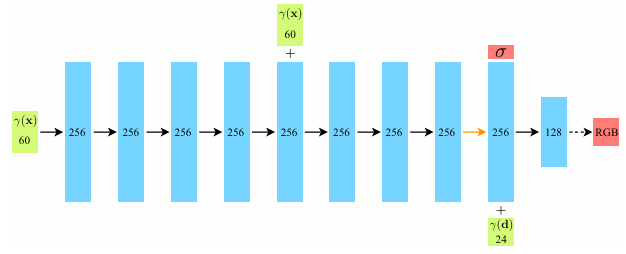

# Encoder

In [2]:
def encoding(x, L=10):
  res = [x]
  for i in range(L):
    for fn in [torch.sin, torch.cos]:
      res.append(fn(2 ** i * torch.pi * x))
  return torch.cat(res,dim=-1)

In [3]:
x = torch.Tensor([3.1,5.6,7.3])
y = encoding(x,L=4)
y.shape

torch.Size([27])

# For Generating 6 view of one single Images (skip if not using own images )

In [ ]:
from diffusers import DiffusionPipeline, EulerAncestralDiscreteScheduler
import torch
from PIL import Image
import requests

# 1. Load the Zero123++ pipeline
pipeline = DiffusionPipeline.from_pretrained(
    "sudo-ai/zero123plus-v1.2",
    custom_pipeline="sudo-ai/zero123plus-pipeline",
    torch_dtype=torch.float16
)
pipeline.scheduler = EulerAncestralDiscreteScheduler.from_config(
    pipeline.scheduler.config, timestep_spacing="trailing"
)
pipeline.to("cuda:0")

# 2. Download your single input image
cond = Image.open("/content/pngimg.com - batman_PNG22.png")

# 3. Run the pipeline to get *all* views
out = pipeline(cond, num_inference_steps=28)  # you can also pass num_images_per_prompt=6 to be explicit :contentReference[oaicite:1]{index=1}
views = out.images  # this is a list of 6 PIL Images

# 4. Save each view separately
for idx, view in enumerate(views):
    view.save(f"view_{idx:02d}.png")


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json: 0.00B [00:00, ?B/s]

pipeline.py: 0.00B [00:00, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

merges.txt: 0.00B [00:00, ?B/s]

scheduler_config.json:   0%|          | 0.00/391 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/708 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/369 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/855 [00:00<?, ?B/s]

text_encoder/model.safetensors:   0%|          | 0.00/681M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/466 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/745 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/672 [00:00<?, ?B/s]

vae/diffusion_pytorch_model.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

vision_encoder/model.safetensors:   0%|          | 0.00/1.26G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/8 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


  0%|          | 0/28 [00:00<?, ?it/s]

# Split the one image into 6 parts (skip if not using own images )

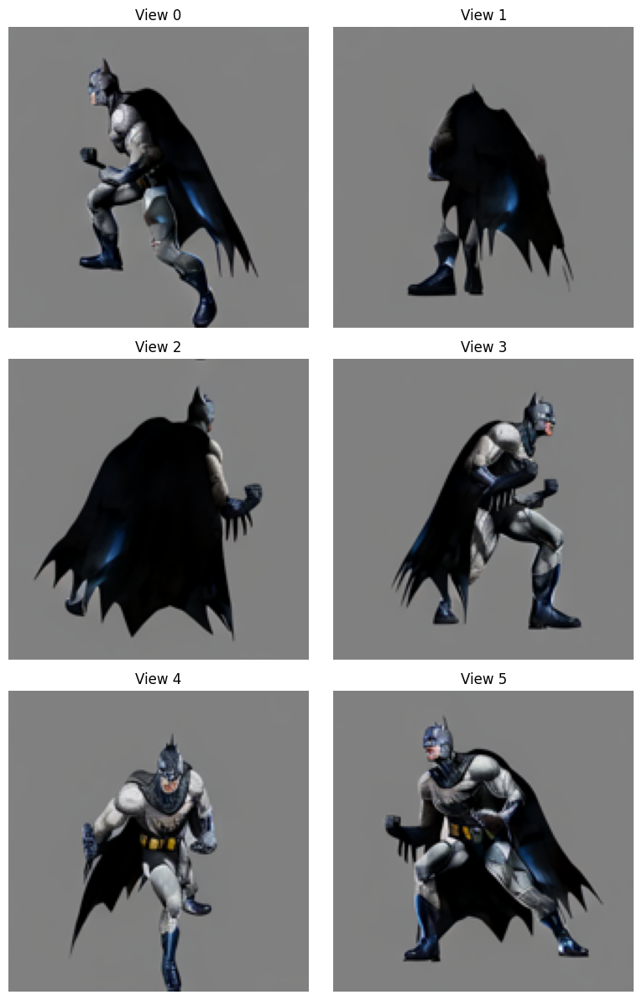

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# Load the grid image
img = Image.open("/content/view_00.png")

# Resize the image to reduce resolution (e.g., to 50% of its original size)
new_width = int(img.width * 0.5)  # 50% reduction
new_height = int(img.height * 0.5)  # 50% reduction
img = img.resize((new_width, new_height))

w, h = img.size

# Assuming a 3x2 grid layout
rows, cols = 3, 2
tile_w, tile_h = w // cols, h // rows

# Create a figure for display
fig, axs = plt.subplots(rows, cols, figsize=(8, 12))

# Split and display individual views
for row in range(rows):
    for col in range(cols):
        left = col * tile_w
        top = row * tile_h
        right = left + tile_w
        bottom = top + tile_h
        cropped = img.crop((left, top, right, bottom))

        idx = row * cols + col
        cropped.save(f"view_{idx:02d}.png")

        axs[row, col].imshow(cropped)
        axs[row, col].axis('off')
        axs[row, col].set_title(f"View {idx}")

plt.tight_layout()
plt.show()


# Saving the npz file (skip if not using own images )

In [ ]:
import numpy as np
from PIL import Image
import glob

image_files = sorted(glob.glob("view_*.png"))
images = [Image.open(f).convert("RGB") for f in image_files]
images_np = np.stack([np.array(img) / 255.0 for img in images])  # [N, H, W, 3]

H, W = images_np.shape[1:3]

focal = 0.5 * W / np.tan(0.5 * np.pi / 3)  # 60 deg FOV
intrinsics = np.array([
    [focal, 0, W / 2],
    [0, focal, H / 2],
    [0, 0, 1]
], dtype=np.float32)

def generate_camera_poses(n_views):
    poses = []
    for i in range(n_views):
        angle = 2 * np.pi * i / n_views
        cam_origin = np.array([np.sin(angle), 0, np.cos(angle)]) * 4.0
        forward = -cam_origin / np.linalg.norm(cam_origin)
        up = np.array([0, 1, 0])
        right = np.cross(up, forward)
        up = np.cross(forward, right)
        pose = np.stack([right, up, forward, cam_origin], axis=1)
        pose = np.vstack([pose, [0, 0, 0, 1]])
        poses.append(pose)
    return np.stack(poses)

poses = generate_camera_poses(len(images))

np.savez("/content/data.npz", images=images_np.astype(np.float32), poses=poses.astype(np.float32), focal=focal)


# For generating 36 images from the single image (skip if not using own images )

model_index.json: 0.00B [00:00, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/466 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/357 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/714 [00:00<?, ?B/s]

text_encoder/pytorch_model.bin:   0%|          | 0.00/681M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/369 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

config.json:   0%|          | 0.00/625 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/579 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.bin:   0%|          | 0.00/1.73G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.bin:   0%|          | 0.00/167M [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

vision_encoder/pytorch_model.bin:   0%|          | 0.00/1.26G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/8 [00:00<?, ?it/s]

An error occurred while trying to fetch /root/.cache/huggingface/hub/models--sudo-ai--zero123plus-v1.1/snapshots/36df7de980afd15f80b2e1a4e9a920d7020e2654/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--sudo-ai--zero123plus-v1.1/snapshots/36df7de980afd15f80b2e1a4e9a920d7020e2654/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /root/.cache/huggingface/hub/models--sudo-ai--zero123plus-v1.1/snapshots/36df7de980afd15f80b2e1a4e9a920d7020e2654/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /root/.cache/huggingface/hub/models--sudo-ai--zero123plus-v1.1/snapshots/36df7de980afd15f80b2e1a4e9a920d7020e2654/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

  0%|          | 0/28 [00:00<?, ?it/s]

✅ Done. Total final images: 36


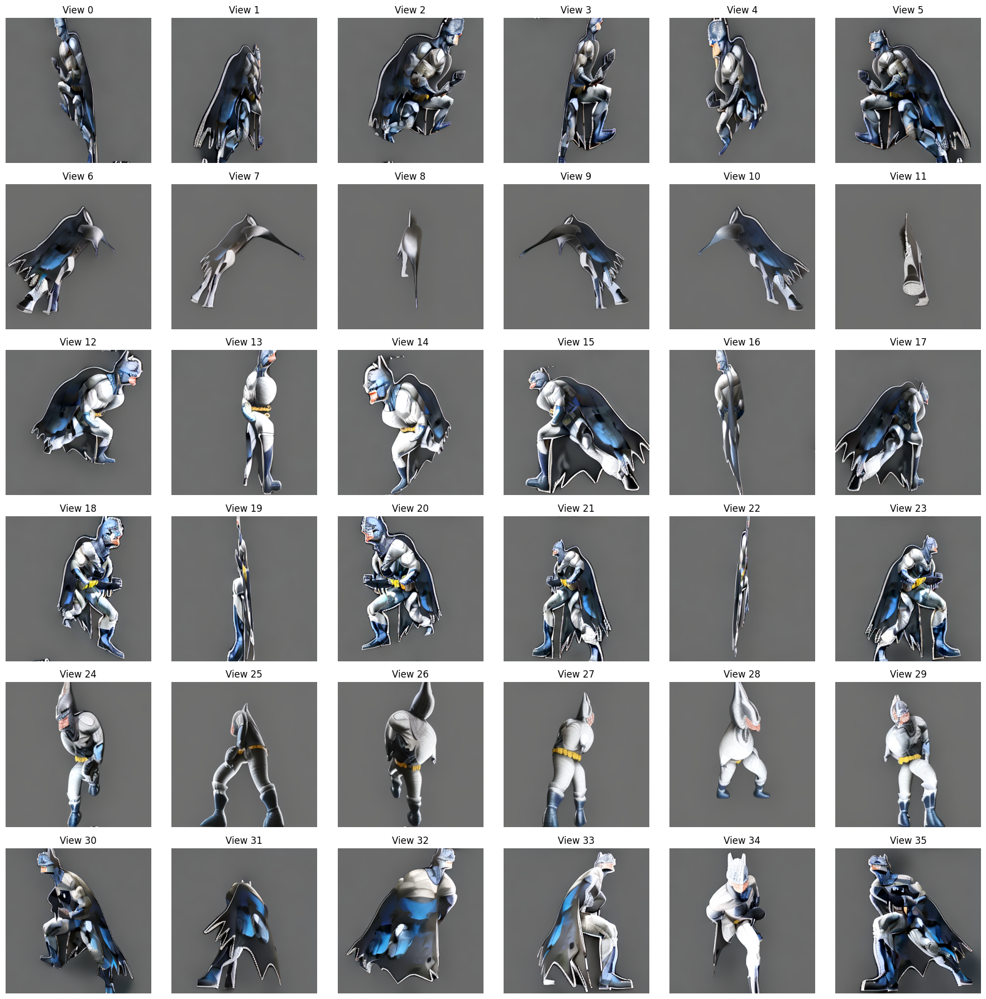

In [ ]:
from diffusers import DiffusionPipeline, EulerAncestralDiscreteScheduler
from PIL import Image
import torch, os
import matplotlib.pyplot as plt

# Load Zero123++ pipeline
pipeline = DiffusionPipeline.from_pretrained(
    "sudo-ai/zero123plus-v1.1",
    custom_pipeline="sudo-ai/zero123plus-pipeline",
    torch_dtype=torch.float16
)
pipeline.scheduler = EulerAncestralDiscreteScheduler.from_config(
    pipeline.scheduler.config, timestep_spacing="trailing"
)
pipeline.to("cuda")

def generate_and_split(image, prefix, output_dir):
    out = pipeline(image, num_inference_steps=28)
    grid = out.images[0]

    w, h = grid.size
    rows, cols = 3, 2
    tile_w, tile_h = w // cols, h // rows
    views = []
    for r in range(rows):
        for c in range(cols):
            left, top = c * tile_w, r * tile_h
            right, bottom = left + tile_w, top + tile_h
            cropped = grid.crop((left, top, right, bottom))
            fname = f"{prefix}_{r*cols + c:02d}.png"
            cropped.save(os.path.join(output_dir, fname))
            views.append(cropped)
    return views

def generate_and_show_36_views(input_path, output_dir="generated_views"):
    os.makedirs(output_dir, exist_ok=True)

    init_img = Image.open(input_path).convert("RGB")
    level1_views = generate_and_split(init_img, "view0", output_dir)

    final_images = []
    for idx, view_img in enumerate(level1_views):
        sub_views = generate_and_split(view_img, f"view1_{idx}", output_dir)
        final_images.extend(sub_views)

    print(f"✅ Done. Total final images: {len(final_images)}")

    # Plot all 36 images
    fig, axs = plt.subplots(6, 6, figsize=(18, 18))
    for i, img in enumerate(final_images):
        row, col = divmod(i, 6)
        axs[row, col].imshow(img)
        axs[row, col].axis('off')
        axs[row, col].set_title(f"View {i}")
    plt.tight_layout()
    plt.show()

# Run
generate_and_show_36_views("/content/pngimg.com - batman_PNG22.png")


# saving to npz file (skip if not using own images )

In [ ]:
import numpy as np
from PIL import Image
import glob

# Load 36 images
image_files = sorted(glob.glob("generated_views/view1_*_*.png"))
images = [Image.open(f).convert("RGB") for f in image_files]
images_np = np.stack([np.array(img) / 255.0 for img in images])  # [N, H, W, 3]

H, W = images_np.shape[1:3]

focal = 0.5 * W / np.tan(0.5 * np.pi / 3)  # 60 deg FOV
intrinsics = np.array([
    [focal, 0, W / 2],
    [0, focal, H / 2],
    [0, 0, 1]
], dtype=np.float32)

def generate_camera_poses(n_views):
    poses = []
    for i in range(n_views):
        angle = 2 * np.pi * i / n_views
        cam_origin = np.array([np.sin(angle), 0, np.cos(angle)]) * 4.0
        forward = -cam_origin / np.linalg.norm(cam_origin)
        up = np.array([0, 1, 0])
        right = np.cross(up, forward)
        up = np.cross(forward, right)
        pose = np.stack([right, up, forward, cam_origin], axis=1)
        pose = np.vstack([pose, [0, 0, 0, 1]])
        poses.append(pose)
    return np.stack(poses)

poses = generate_camera_poses(len(images))

np.savez("/content/data.npz", images=images_np.astype(np.float32), poses=poses.astype(np.float32), focal=focal)


# Nerf block

In [4]:
class NeRF(nn.Module):
  def __init__(self, pos_enc_dim=63, view_enc_dim=27, hidden=256) -> None:
     super().__init__()

     self.linear1 = nn.Sequential(nn.Linear(pos_enc_dim,hidden),nn.ReLU())

     self.pre_skip_linear = nn.Sequential()
     for _ in range(4):
      self.pre_skip_linear.append(nn.Linear(hidden,hidden))
      self.pre_skip_linear.append(nn.ReLU())

     self.linear_skip = nn.Sequential(nn.Linear(pos_enc_dim+hidden,hidden),nn.ReLU())

     self.post_skip_linear = nn.Sequential()
     for _ in range(2):
      self.post_skip_linear.append(nn.Linear(hidden,hidden))
      self.post_skip_linear.append(nn.ReLU())

     self.density_layer = nn.Sequential(nn.Linear(hidden,1),nn.ReLU())

     self.linear2 = nn.Linear(hidden,hidden)

     self.color_linear1 = nn.Sequential(nn.Linear(hidden+view_enc_dim,hidden//2),nn.ReLU())
     self.color_linear2 = nn.Sequential(nn.Linear(hidden//2,3),nn.Sigmoid())

  def forward(self, input):

    positions = input[...,:3]
    view_dirs = input[...,3:]

    # Encode
    pos_enc = encoding(positions,L=10)
    view_enc = encoding(view_dirs,L=4)

    x = self.linear1(pos_enc)
    x = self.pre_skip_linear(x)

    # Skip connection
    x = torch.cat([x,pos_enc],dim=-1)
    x = self.linear_skip(x)

    x = self.post_skip_linear(x)

    # Density
    sigma = self.density_layer(x)

    x = self.linear2(x)

    # View Encoding
    x = torch.cat([x,view_enc],dim=-1)
    x = self.color_linear1(x)

    # Color Prediction
    rgb = self.color_linear2(x)

    return torch.cat([sigma,rgb],dim=-1)


# Get Ray + Render

In [5]:
def get_rays(H, W, focal, c2w):
  """
  Generate rays for a given camera configuration.

  Args:
    H: Image height.
    W: Image width.
    focal: Focal length.
    c2w: Camera-to-world transformation matrix (4x4).

  Returns:
    rays_o: Ray origins (H*W, 3).
    rays_d: Ray directions (H*W, 3).
  """
  device = c2w.device  # Get the device of c2w
  focal = torch.from_numpy(focal).to(device)
  # print(type(H), type(W), type(focal), type(c2w))

  i, j = torch.meshgrid(
      torch.arange(W, dtype=torch.float32, device=device),
      torch.arange(H, dtype=torch.float32, device=device),
      indexing='xy'
  )
  dirs = torch.stack(
      [(i - W * .5) / focal, -(j - H * .5) / focal, -torch.ones_like(i, device = device)], -1
  )

  rays_d = torch.sum(dirs[..., None, :] * c2w[:3, :3], -1)
  rays_d = rays_d.view(-1, 3)
  rays_o = c2w[:3, -1].expand(rays_d.shape)

  return rays_o, rays_d

def render_rays(network_fn, rays_o, rays_d, near, far, N_samples, device, rand=False, embed_fn=None, chunk=1024*4):
    def batchify(fn, chunk):
        return lambda inputs: torch.cat([fn(inputs[i:i+chunk]) for i in range(0, inputs.shape[0], chunk)], 0)

    # Sampling
    z_vals = torch.linspace(near, far, steps=N_samples, device=device)

    if rand:
        z_vals += torch.rand(*z_vals.shape[:-1], N_samples, device=rays_o.device) * (far - near) / N_samples

    pts = rays_o[...,None,:] + rays_d[...,None,:] * z_vals[...,:,None]

    # Normalize view directions
    view_dirs = rays_d / torch.norm(rays_d, dim=-1, keepdim=True)
    view_dirs = view_dirs[..., None, :].expand(pts.shape)

    input_pts = torch.cat((pts, view_dirs), dim=-1)
    raw = batchify(network_fn, chunk)(input_pts)

    # Apply activations here instead of in network
    sigma_a = raw[...,0]  # Shape: [batch, N_samples]
    rgb = raw[...,1:]    # Shape: [batch, N_samples, 3]

    # Improved volume rendering
    dists = z_vals[..., 1:] - z_vals[..., :-1]  # Shape: [batch, N_samples-1]
    dists = torch.cat([dists, torch.tensor([1e10], device=device)], -1)

    # No need to manually expand dists as broadcasting will handle it
    alpha = 1. - torch.exp(-sigma_a * dists)  # Shape: [batch, N_samples]
    alpha = alpha.unsqueeze(-1)  # Shape: [batch, N_samples, 1]

    # Computing transmittance
    ones_shape = (alpha.shape[0], 1, 1)
    T = torch.cumprod(
        torch.cat([
            torch.ones(ones_shape, device=device),
            1. - alpha + 1e-10
        ], dim=1),
        dim=1
    )[:, :-1]  # Shape: [batch, N_samples, 1]

    weights = alpha * T  # Shape: [batch, N_samples, 1]

    # Compute final colors and depths
    rgb_map = torch.sum(weights * rgb, dim=1)  # Sum along sample dimension
    depth_map = torch.sum(weights.squeeze(-1) * z_vals, dim=-1)  # Shape: [batch]
    acc_map = torch.sum(weights.squeeze(-1), dim=-1)  # Shape: [batch]

    return rgb_map, depth_map, acc_map

# model train

In [6]:
def train(images, poses, H, W, focal, testpose, testimg, device, N_rand=512):

    print(f"Using device: {device}")
    model = NeRF().to(device)

    criterion = nn.MSELoss(reduction='mean')
    optimizer = torch.optim.Adam(model.parameters(), lr=2e-4)
    scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.99)

    n_iter = 5000
    n_samples = 64
    i_plot = 50
    psnrs = []
    iternums = []
    t = time.time()

    images_tensor = torch.from_numpy(images).float().to(device)
    poses_tensor = torch.from_numpy(poses).float().to(device)

    for i in range(n_iter):

        img_i = np.random.randint(images.shape[0])
        target = images_tensor[img_i]
        pose = poses_tensor[img_i]

        rays_o, rays_d = get_rays(H, W, focal, pose)

        # Flatten rays and target image to sample a subset
        rays_o = rays_o.reshape(-1, 3)
        rays_d = rays_d.reshape(-1, 3)
        target = target.reshape(-1, 3)

        select_inds = np.random.choice(rays_o.shape[0], size=N_rand, replace=False)
        rays_o = rays_o[select_inds]
        rays_d = rays_d[select_inds]
        target = target[select_inds]

        optimizer.zero_grad()
        rgb, depth, acc = render_rays(model, rays_o, rays_d, near=2., far=6., N_samples=n_samples, device=device, rand=True)

        loss = criterion(rgb, target)
        loss.backward()
        optimizer.step()

        if i % i_plot == 0:
            print(f'Iteration: {i}, Loss: {loss.item():.6f}, Time: {(time.time() - t) / i_plot:.2f} sec/iter')
            t = time.time()

            with torch.no_grad():
                rays_o, rays_d = get_rays(H, W, focal, testpose)
                rgb, depth, acc = render_rays(model, rays_o, rays_d, near=2., far=6.,
                                              N_samples=n_samples, device=device)
                rgb = rgb.reshape(H, W, 3)
                loss = criterion(rgb, testimg)
                psnr = -10. * torch.log10(loss)

                psnrs.append(psnr.item())
                iternums.append(i)

                plt.figure(figsize=(10,4))
                plt.subplot(121)
                plt.imshow(rgb.cpu().detach())
                plt.title(f'Iteration: {i}')
                plt.subplot(122)
                plt.plot(iternums, psnrs)
                plt.title('PSNR')
                plt.show()

    return model


# sample dataset ( use this if you are not using own image )

In [7]:
if not os.path.exists('tiny_nerf_data.npz'):
    !wget http://cseweb.ucsd.edu/~viscomp/projects/LF/papers/ECCV20/nerf/tiny_nerf_data.npz

--2026-05-26 09:28:52--  http://cseweb.ucsd.edu/~viscomp/projects/LF/papers/ECCV20/nerf/tiny_nerf_data.npz
Resolving cseweb.ucsd.edu (cseweb.ucsd.edu)... 132.239.8.30
Connecting to cseweb.ucsd.edu (cseweb.ucsd.edu)|132.239.8.30|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cseweb.ucsd.edu//~viscomp/projects/LF/papers/ECCV20/nerf/tiny_nerf_data.npz [following]
--2026-05-26 09:28:52--  https://cseweb.ucsd.edu//~viscomp/projects/LF/papers/ECCV20/nerf/tiny_nerf_data.npz
Connecting to cseweb.ucsd.edu (cseweb.ucsd.edu)|132.239.8.30|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12727482 (12M)
Saving to: ‘tiny_nerf_data.npz’

tiny_nerf_data.npz  100%[===================>]  12.14M  --.-KB/s    in 0.1s    

2026-05-26 09:28:52 (98.5 MB/s) - ‘tiny_nerf_data.npz’ saved [12727482/12727482]



# load data

(106, 100, 100, 3) (106, 4, 4) 138.88887889922103


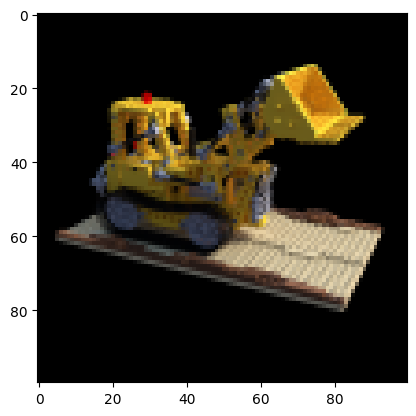

In [9]:
data = np.load('/content/tiny_nerf_data.npz')
images = data['images']
poses = data['poses']
focal = data['focal']
H, W = images.shape[1:3]
print(images.shape, poses.shape, focal)
device = "cuda" if torch.cuda.is_available() else "cpu"

testimg, testpose = images[2], poses[3]
images = images[:100,...,:3]
poses = poses[:100]
plt.imshow(testimg)
plt.show()
testimg =  torch.from_numpy(testimg).float().to("cuda")
testpose = torch.from_numpy(testpose).float().to("cuda")

# model train

Using device: cuda
Iteration: 0, Loss: 0.080586, Time: 0.02 sec/iter


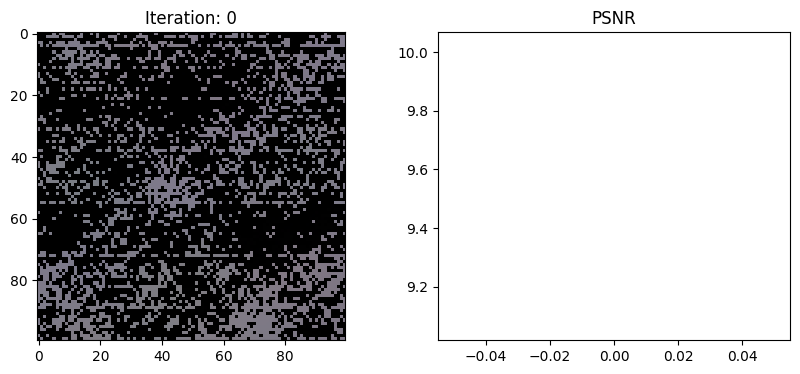

Iteration: 50, Loss: 0.062752, Time: 0.05 sec/iter


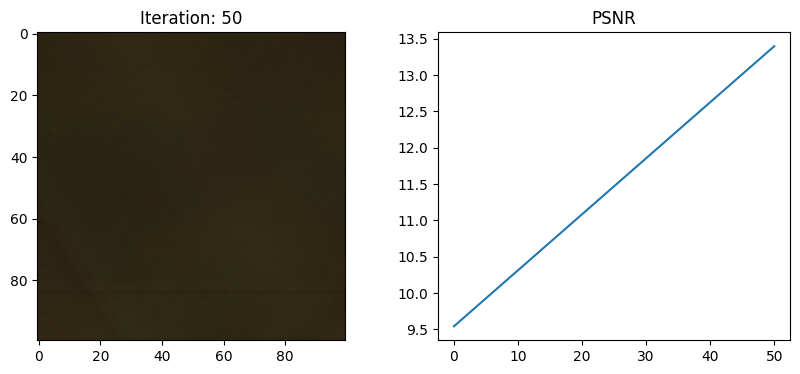

Iteration: 100, Loss: 0.066620, Time: 0.05 sec/iter


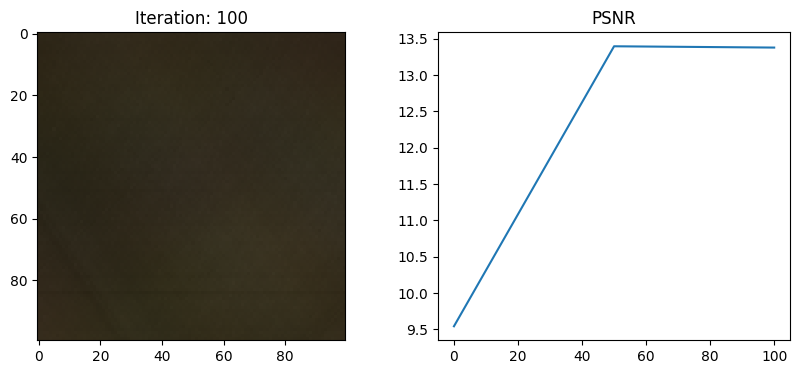

Iteration: 150, Loss: 0.098510, Time: 0.05 sec/iter


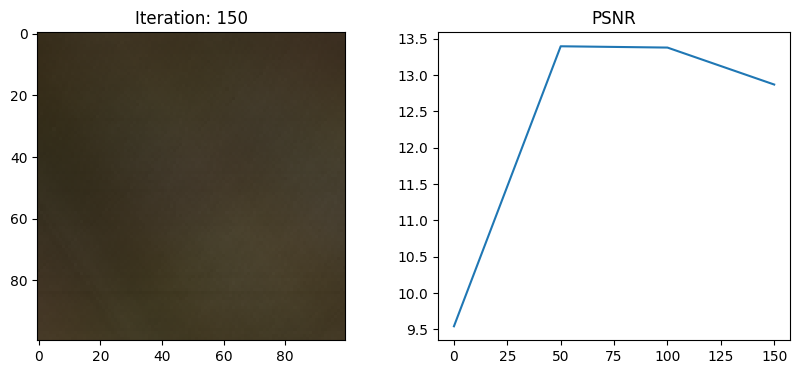

Iteration: 200, Loss: 0.087700, Time: 0.05 sec/iter


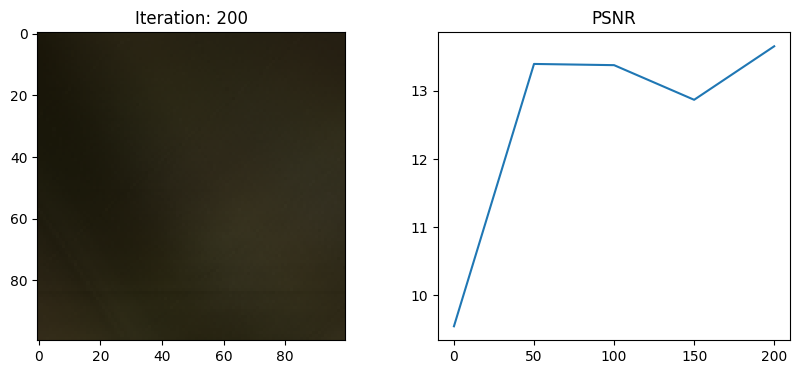

Iteration: 250, Loss: 0.073580, Time: 0.06 sec/iter


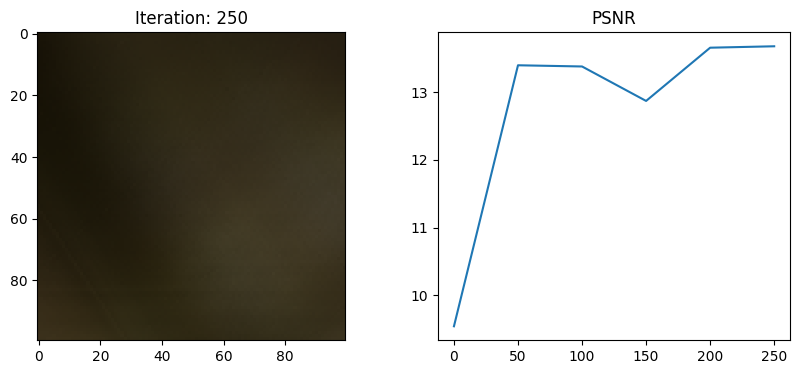

Iteration: 300, Loss: 0.039586, Time: 0.05 sec/iter


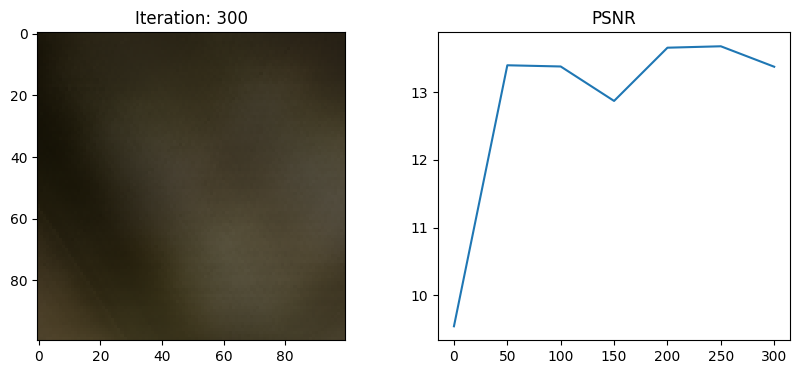

Iteration: 350, Loss: 0.090852, Time: 0.05 sec/iter


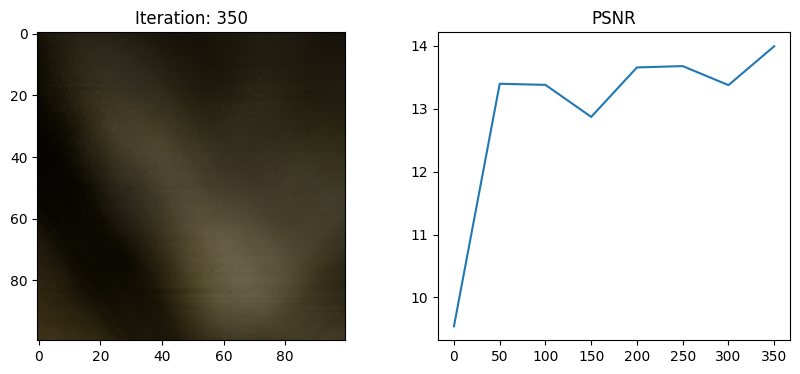

Iteration: 400, Loss: 0.041597, Time: 0.05 sec/iter


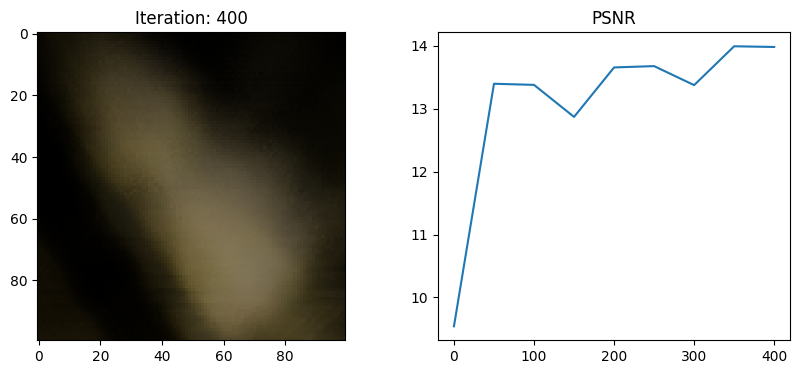

Iteration: 450, Loss: 0.018540, Time: 0.06 sec/iter


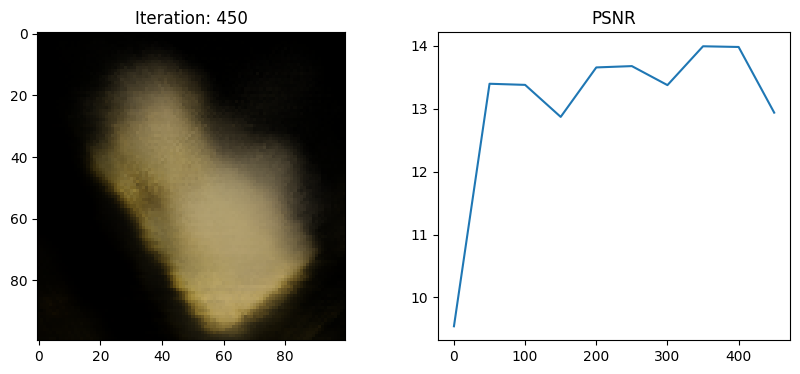

Iteration: 500, Loss: 0.035065, Time: 0.05 sec/iter


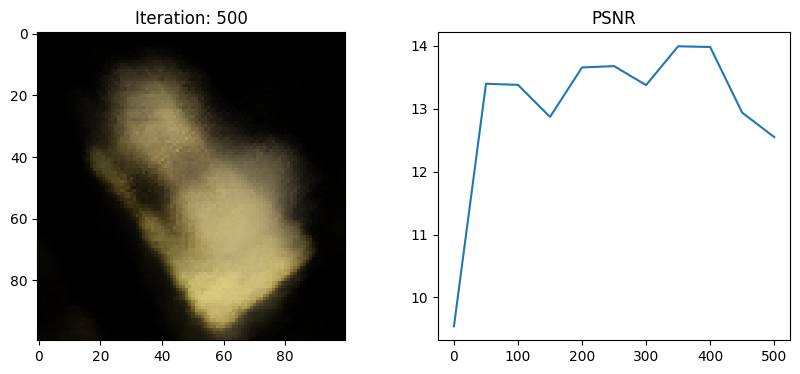

Iteration: 550, Loss: 0.011814, Time: 0.05 sec/iter


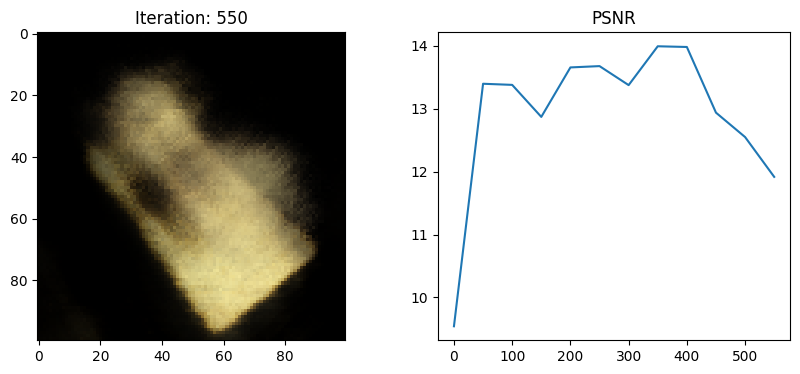

Iteration: 600, Loss: 0.014755, Time: 0.05 sec/iter


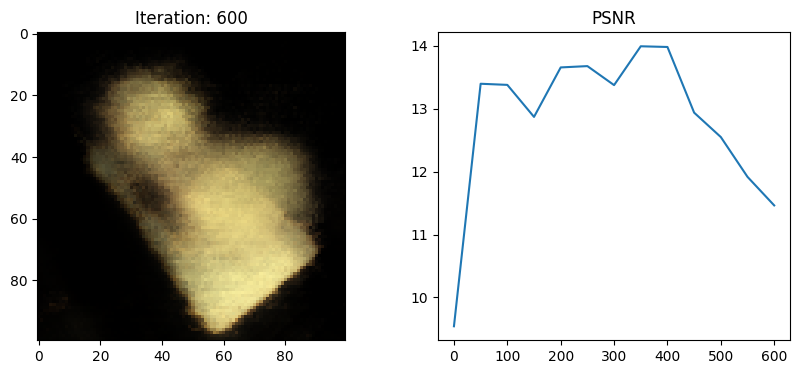

Iteration: 650, Loss: 0.020514, Time: 0.05 sec/iter


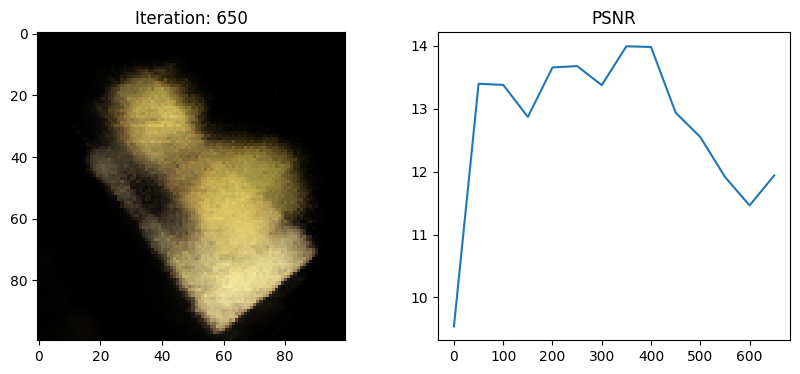

Iteration: 700, Loss: 0.019071, Time: 0.05 sec/iter


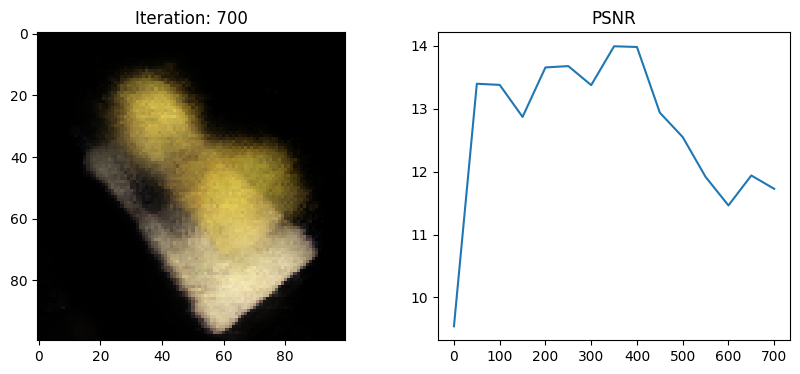

Iteration: 750, Loss: 0.006971, Time: 0.05 sec/iter


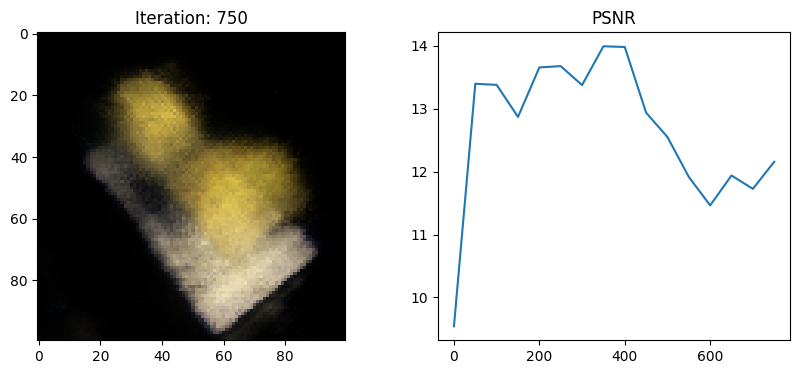

Iteration: 800, Loss: 0.010894, Time: 0.05 sec/iter


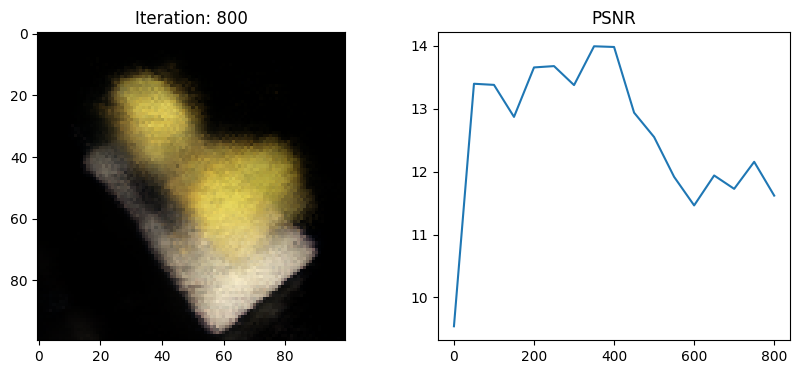

Iteration: 850, Loss: 0.007240, Time: 0.05 sec/iter


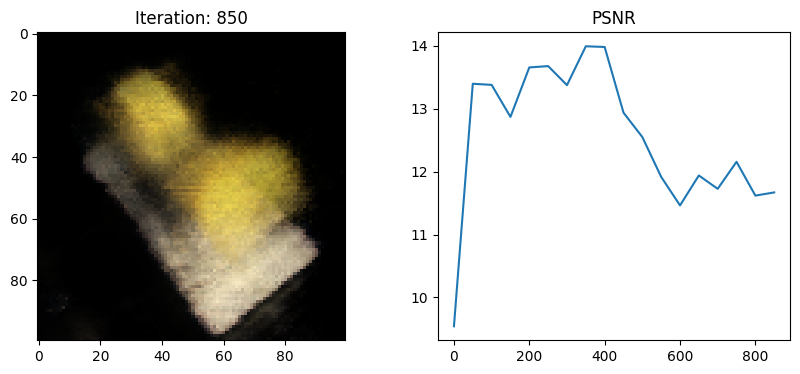

Iteration: 900, Loss: 0.014514, Time: 0.05 sec/iter


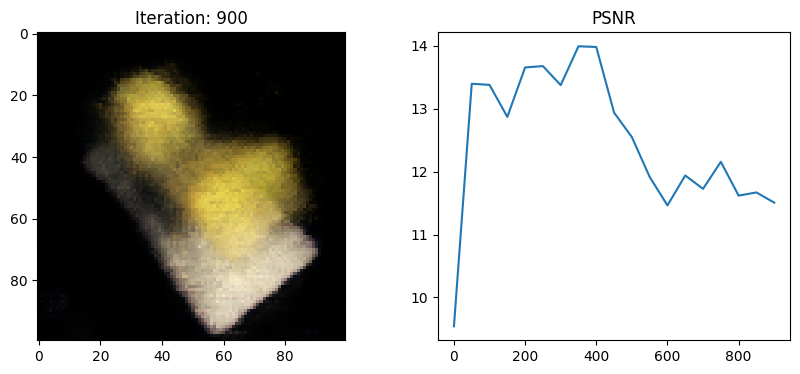

Iteration: 950, Loss: 0.008628, Time: 0.05 sec/iter


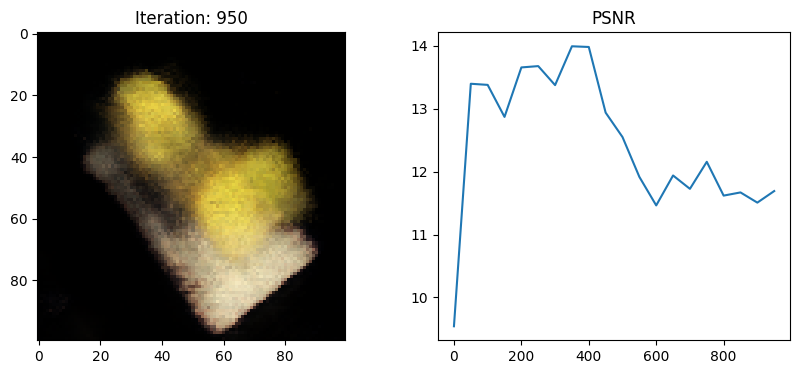

Iteration: 1000, Loss: 0.012848, Time: 0.05 sec/iter


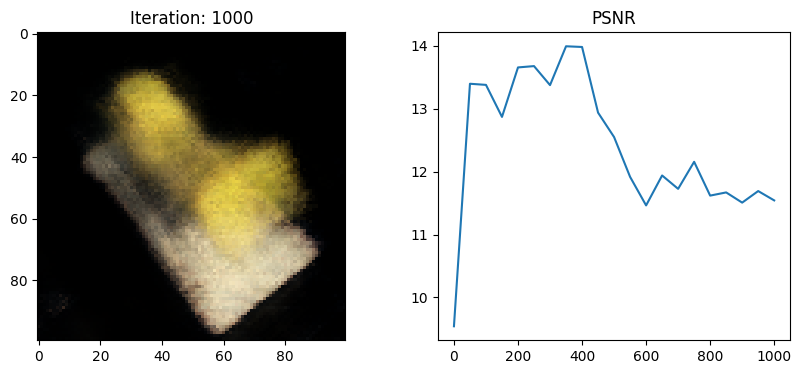

Iteration: 1050, Loss: 0.013338, Time: 0.05 sec/iter


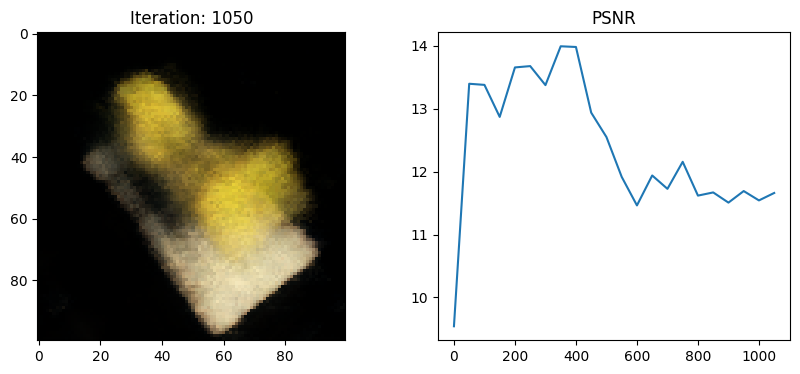

Iteration: 1100, Loss: 0.014155, Time: 0.05 sec/iter


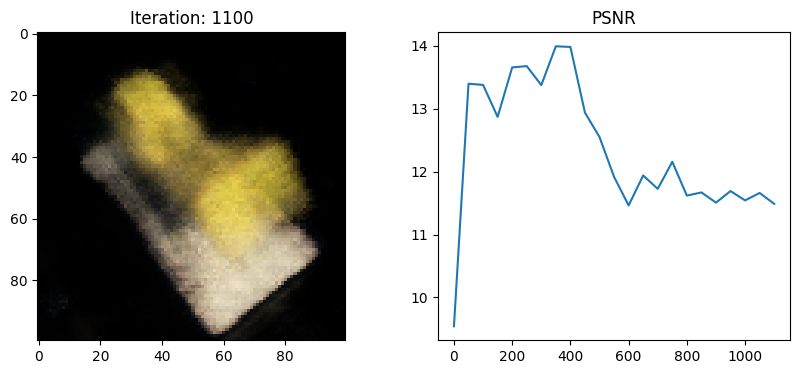

Iteration: 1150, Loss: 0.011900, Time: 0.05 sec/iter


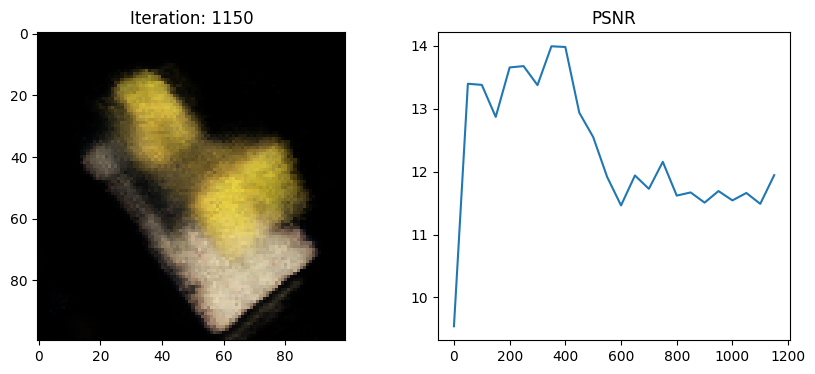

Iteration: 1200, Loss: 0.013761, Time: 0.06 sec/iter


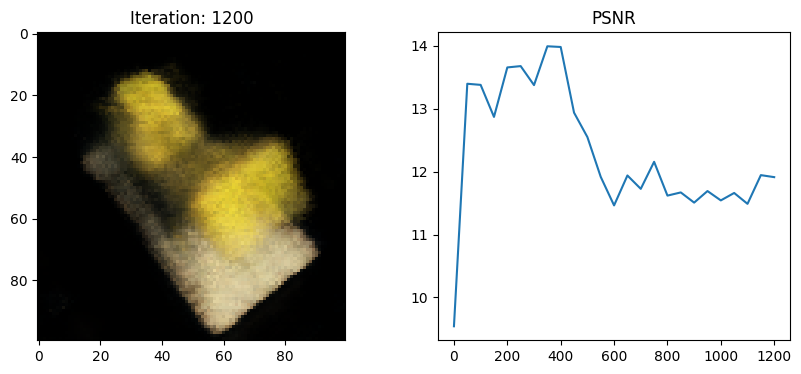

Iteration: 1250, Loss: 0.010034, Time: 0.05 sec/iter


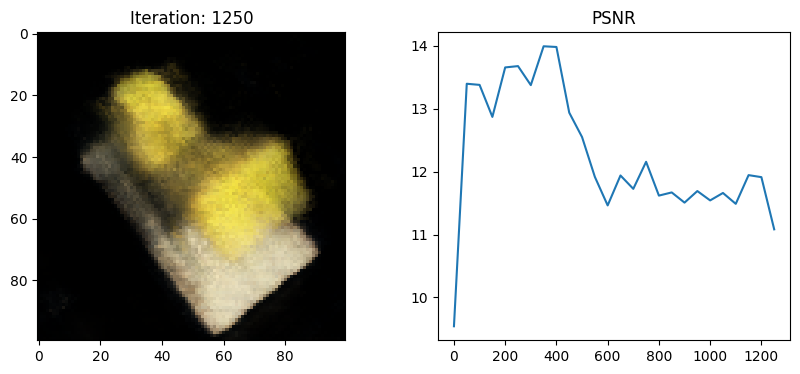

Iteration: 1300, Loss: 0.014596, Time: 0.05 sec/iter


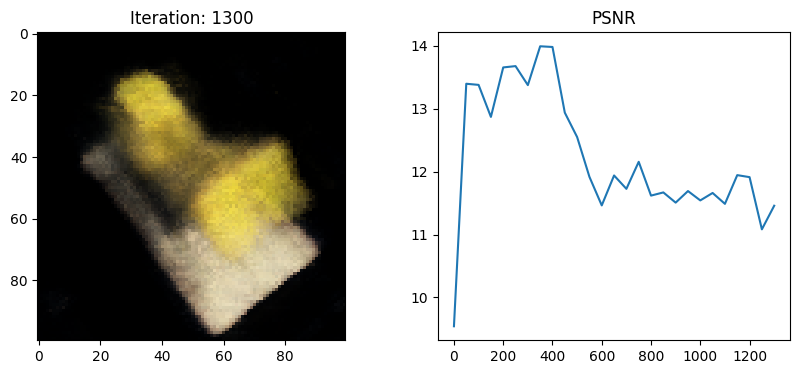

Iteration: 1350, Loss: 0.011155, Time: 0.05 sec/iter


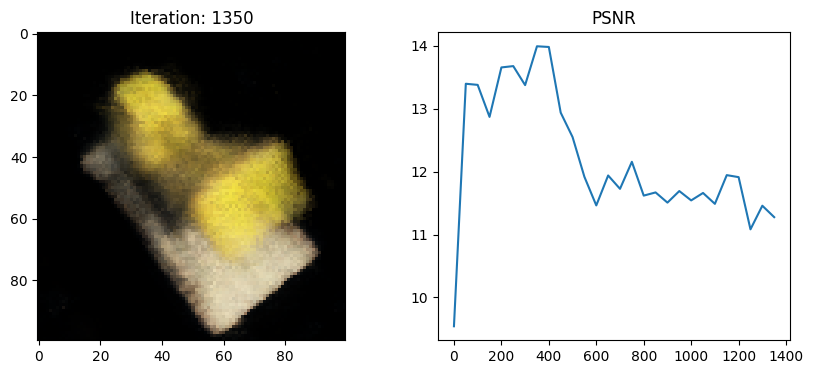

Iteration: 1400, Loss: 0.010217, Time: 0.06 sec/iter


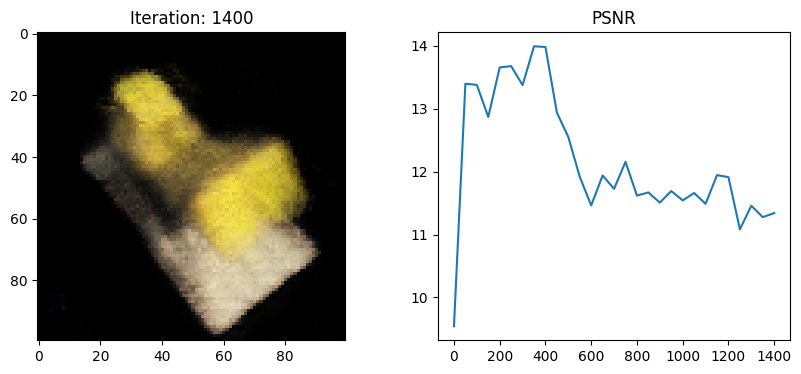

Iteration: 1450, Loss: 0.009914, Time: 0.05 sec/iter


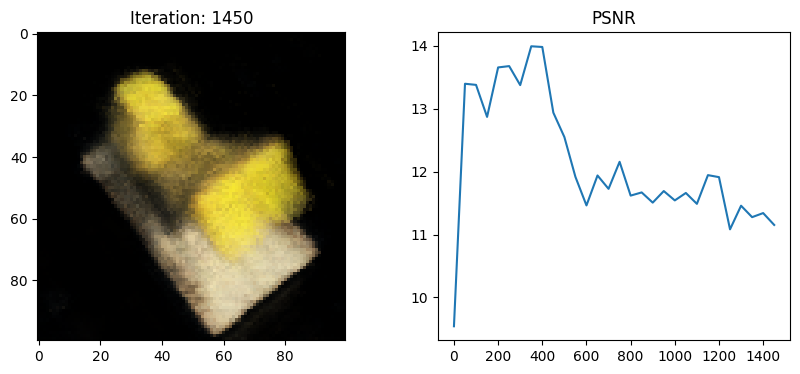

Iteration: 1500, Loss: 0.010589, Time: 0.05 sec/iter


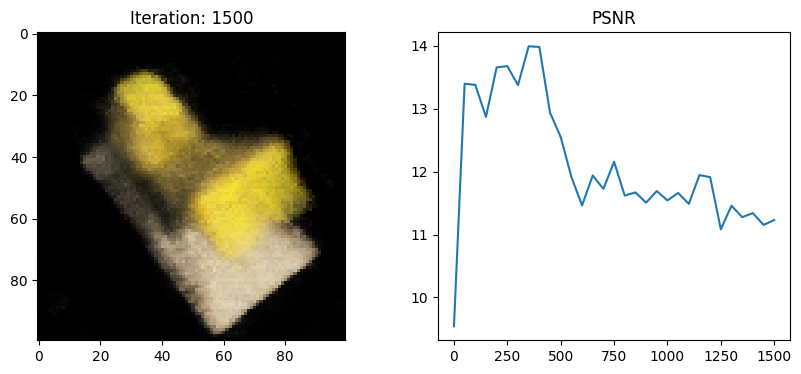

Iteration: 1550, Loss: 0.010281, Time: 0.05 sec/iter


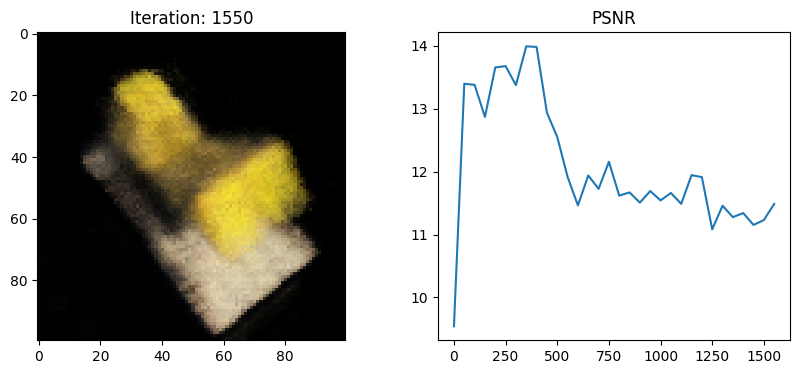

Iteration: 1600, Loss: 0.005351, Time: 0.05 sec/iter


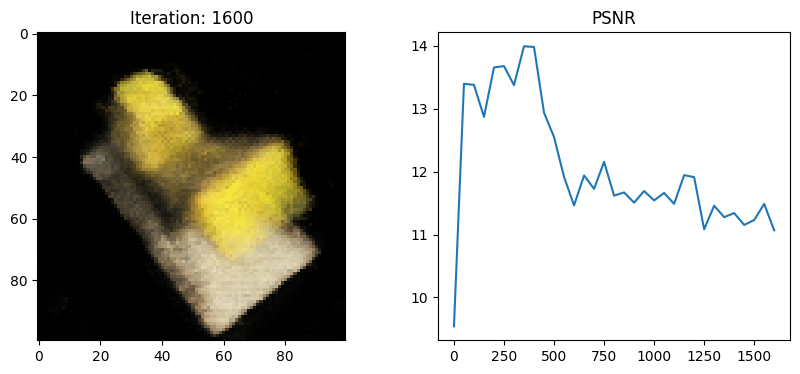

Iteration: 1650, Loss: 0.010256, Time: 0.06 sec/iter


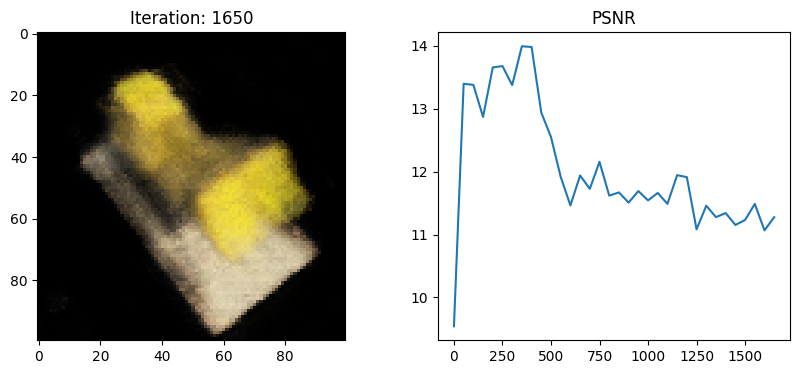

Iteration: 1700, Loss: 0.015094, Time: 0.05 sec/iter


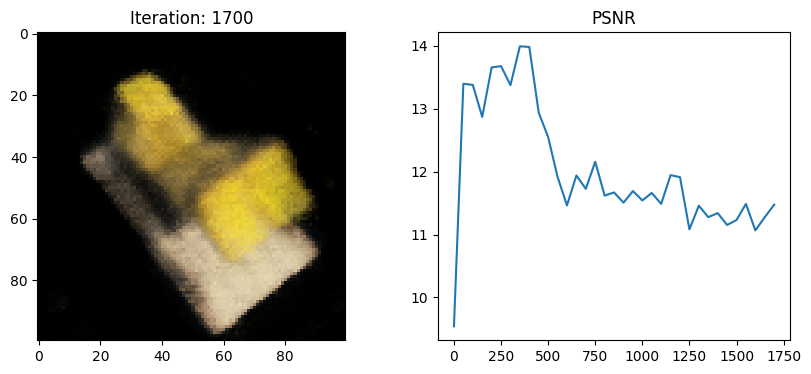

Iteration: 1750, Loss: 0.007955, Time: 0.05 sec/iter


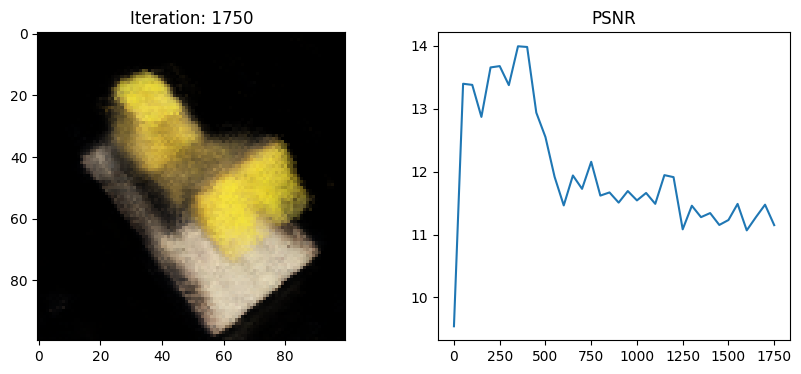

Iteration: 1800, Loss: 0.006353, Time: 0.05 sec/iter


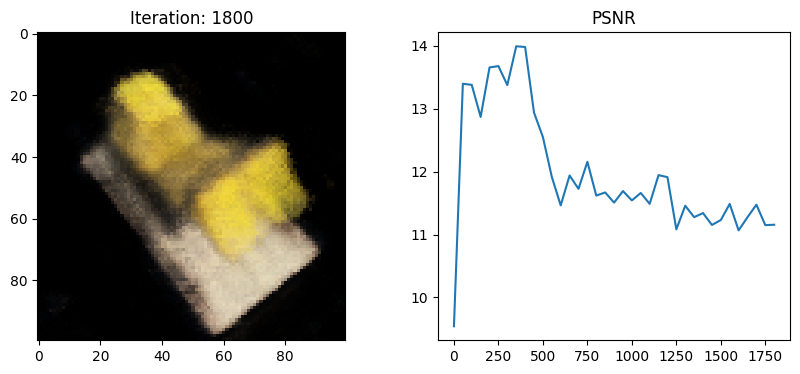

Iteration: 1850, Loss: 0.008633, Time: 0.06 sec/iter


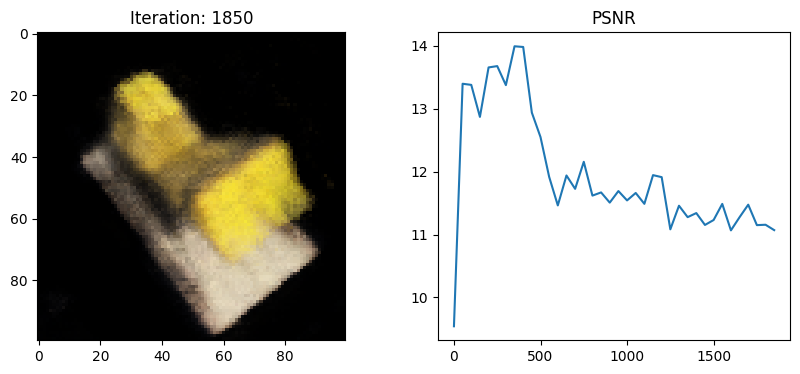

Iteration: 1900, Loss: 0.010276, Time: 0.05 sec/iter


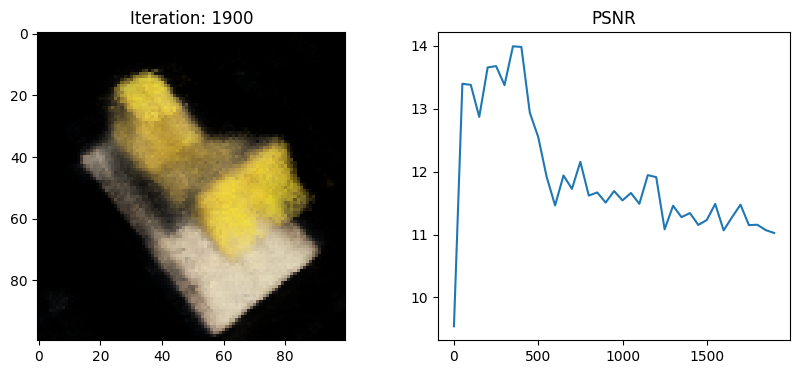

Iteration: 1950, Loss: 0.009072, Time: 0.05 sec/iter


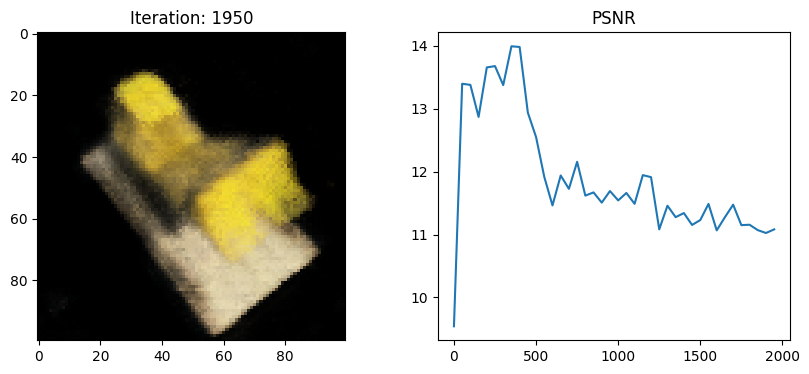

Iteration: 2000, Loss: 0.004132, Time: 0.05 sec/iter


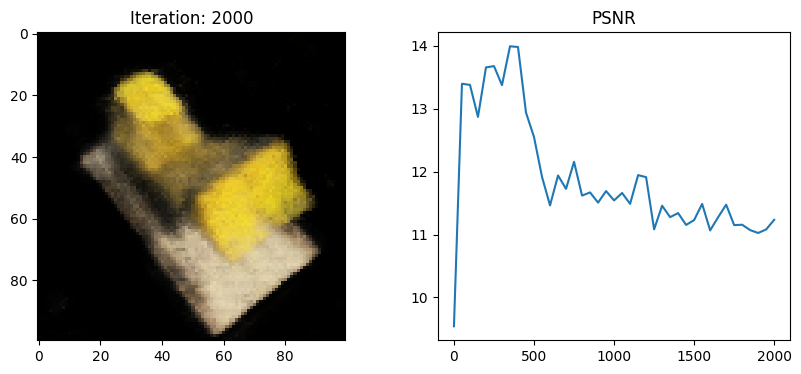

Iteration: 2050, Loss: 0.005409, Time: 0.05 sec/iter


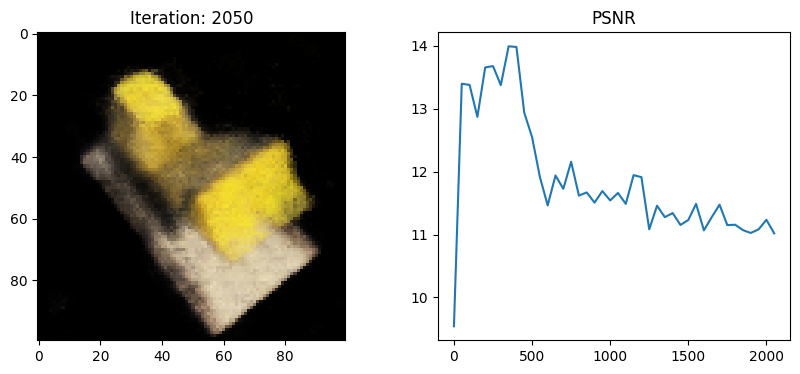

Iteration: 2100, Loss: 0.008907, Time: 0.06 sec/iter


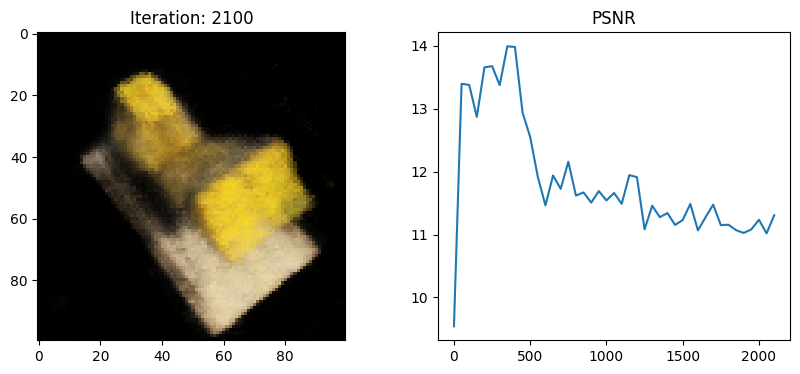

Iteration: 2150, Loss: 0.008093, Time: 0.05 sec/iter


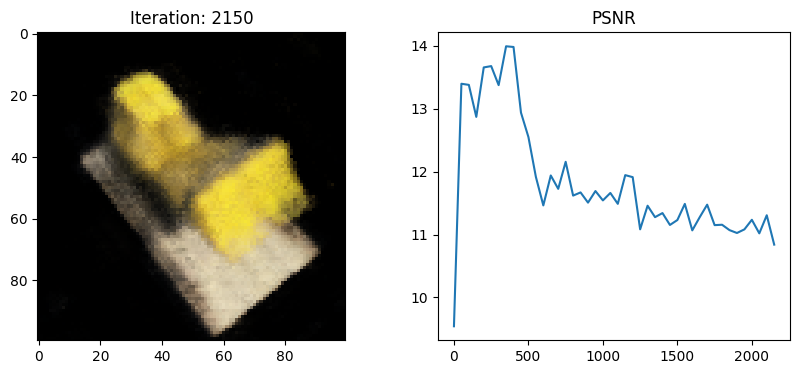

Iteration: 2200, Loss: 0.008657, Time: 0.05 sec/iter


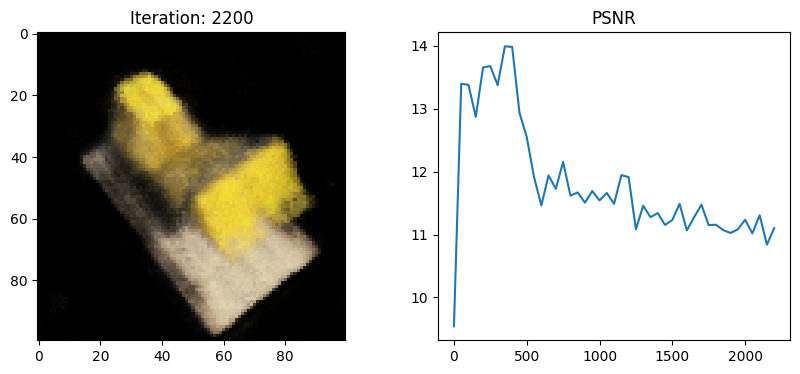

Iteration: 2250, Loss: 0.008057, Time: 0.05 sec/iter


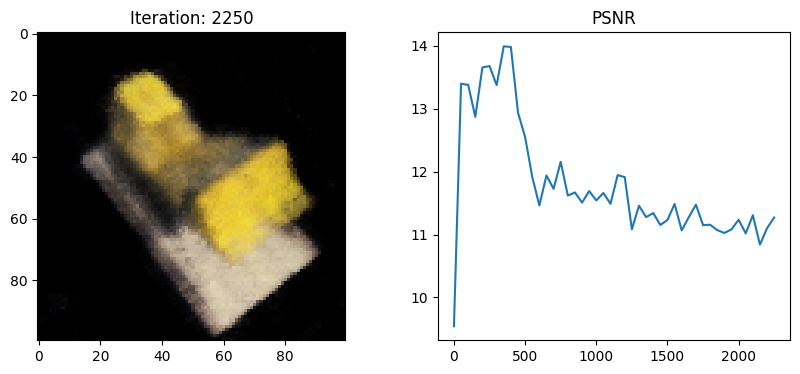

Iteration: 2300, Loss: 0.005656, Time: 0.05 sec/iter


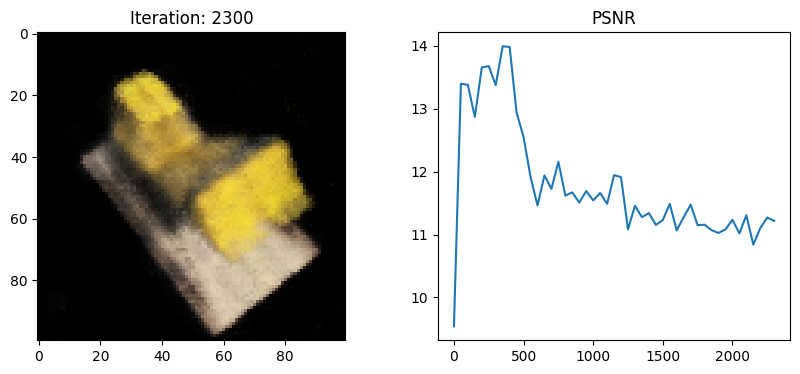

Iteration: 2350, Loss: 0.007307, Time: 0.05 sec/iter


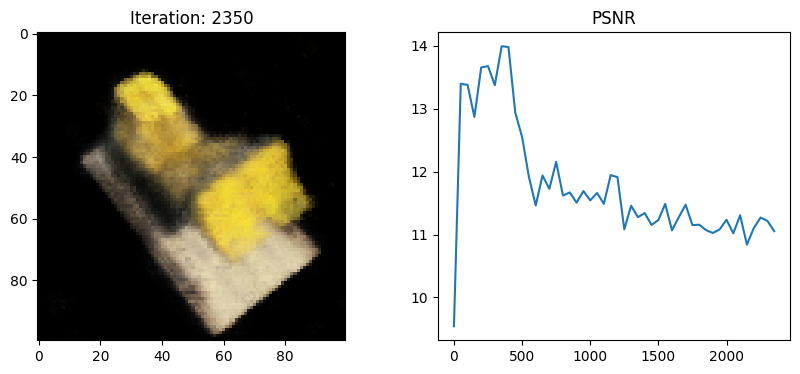

Iteration: 2400, Loss: 0.006296, Time: 0.05 sec/iter


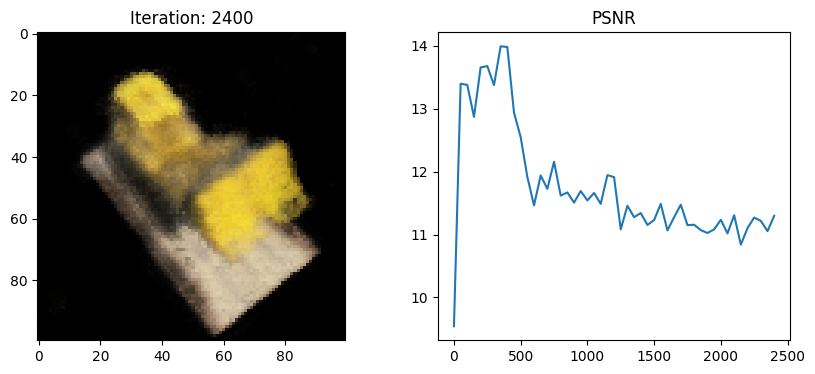

Iteration: 2450, Loss: 0.007807, Time: 0.05 sec/iter


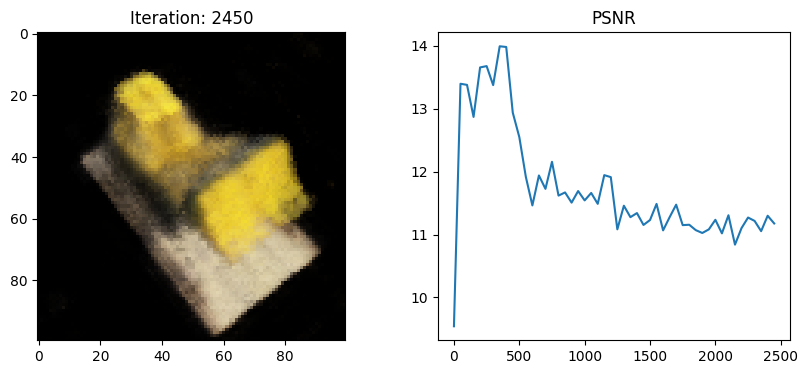

Iteration: 2500, Loss: 0.005642, Time: 0.05 sec/iter


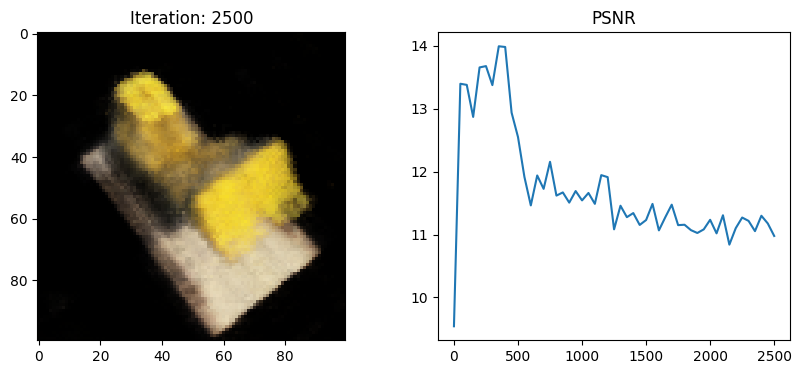

Iteration: 2550, Loss: 0.007630, Time: 0.05 sec/iter


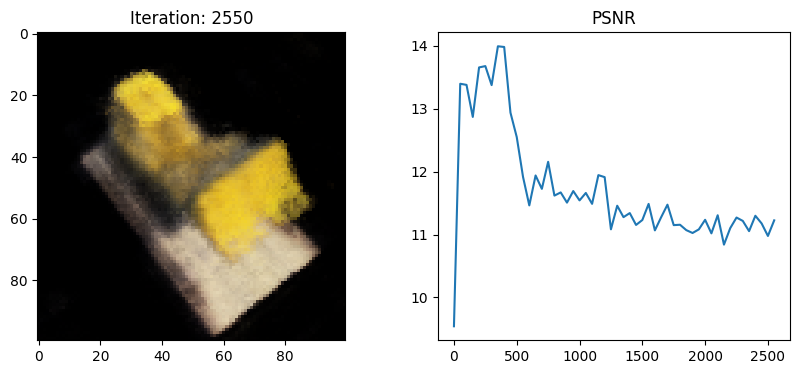

Iteration: 2600, Loss: 0.006589, Time: 0.05 sec/iter


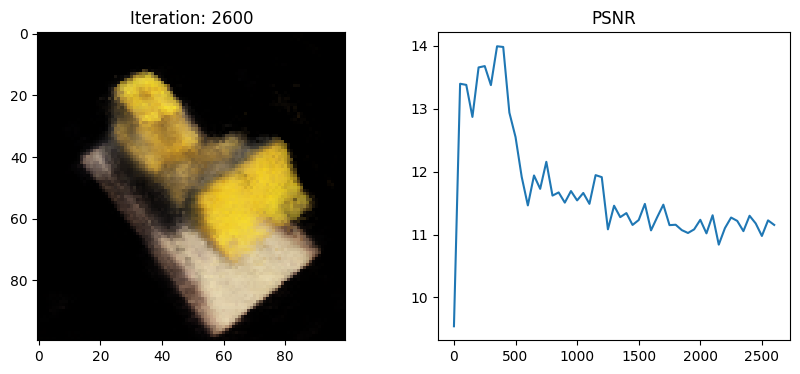

Iteration: 2650, Loss: 0.009779, Time: 0.05 sec/iter


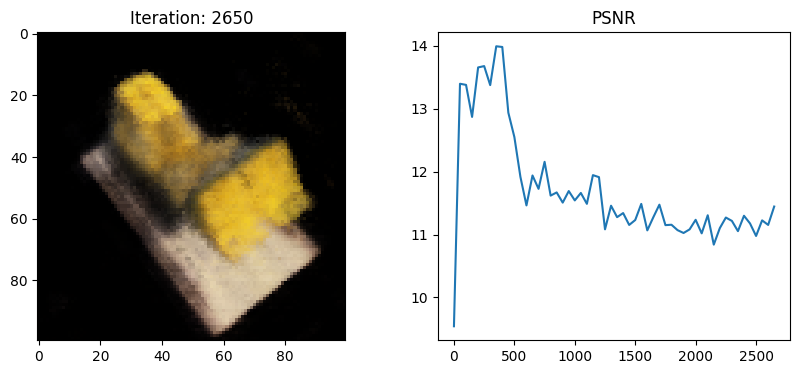

Iteration: 2700, Loss: 0.003439, Time: 0.05 sec/iter


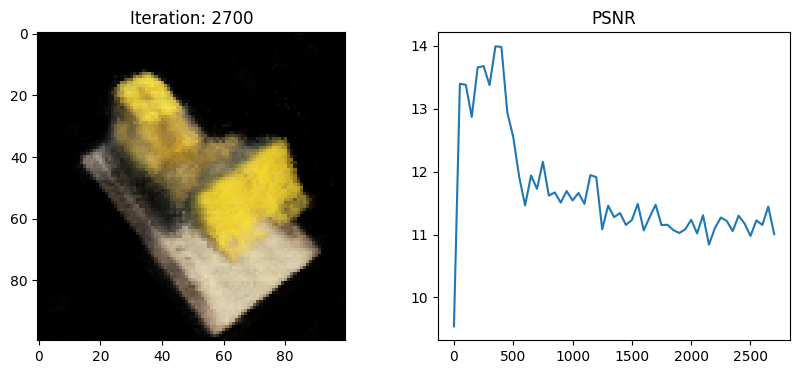

Iteration: 2750, Loss: 0.006412, Time: 0.05 sec/iter


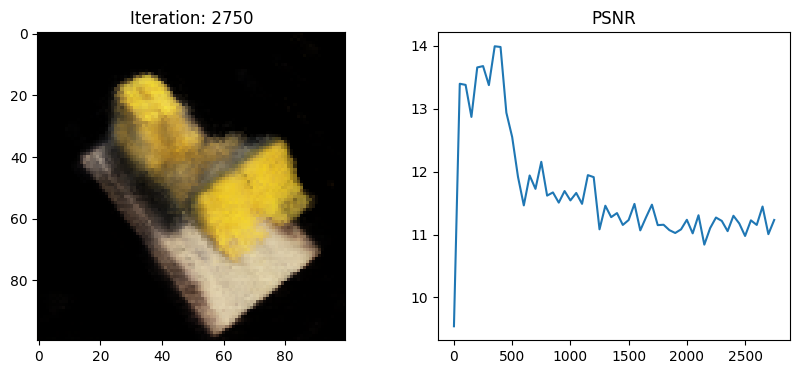

Iteration: 2800, Loss: 0.008265, Time: 0.05 sec/iter


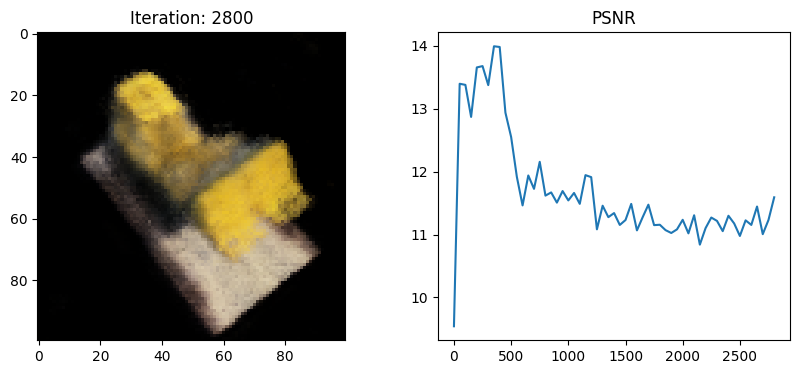

Iteration: 2850, Loss: 0.004172, Time: 0.05 sec/iter


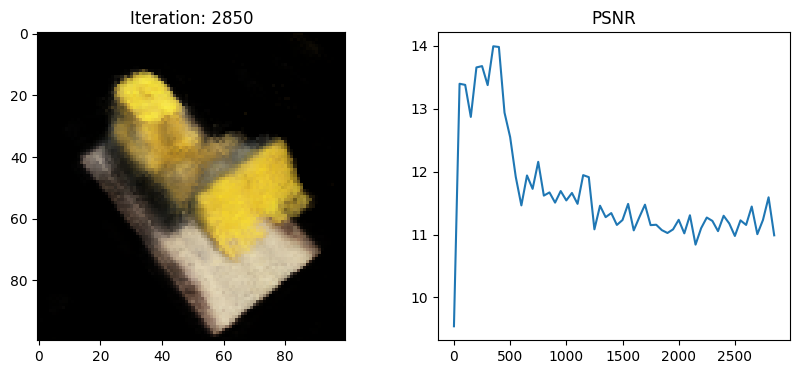

Iteration: 2900, Loss: 0.005325, Time: 0.05 sec/iter


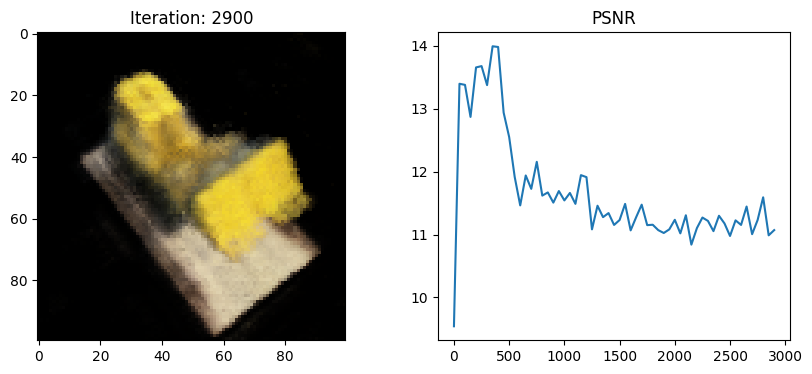

Iteration: 2950, Loss: 0.005906, Time: 0.05 sec/iter


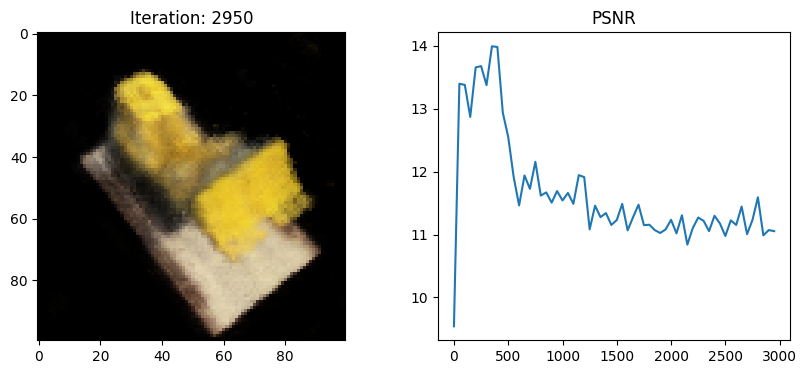

Iteration: 3000, Loss: 0.005623, Time: 0.05 sec/iter


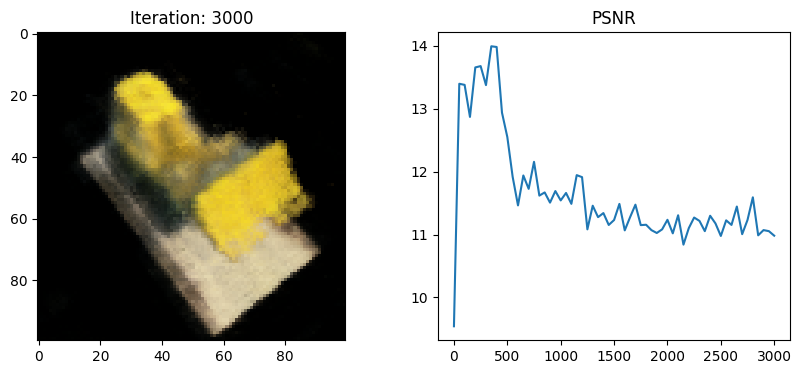

Iteration: 3050, Loss: 0.004013, Time: 0.06 sec/iter


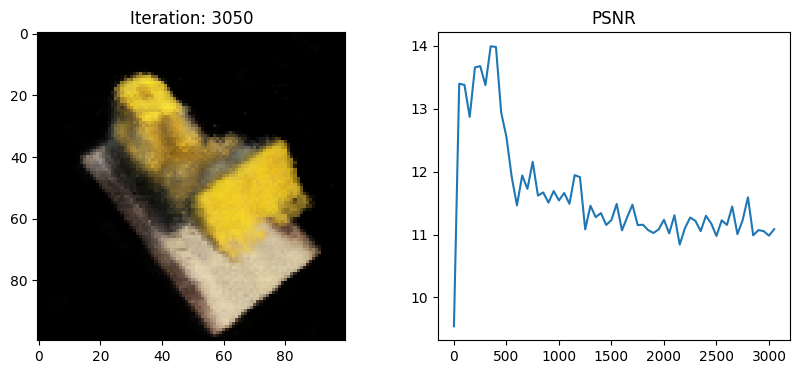

Iteration: 3100, Loss: 0.007512, Time: 0.05 sec/iter


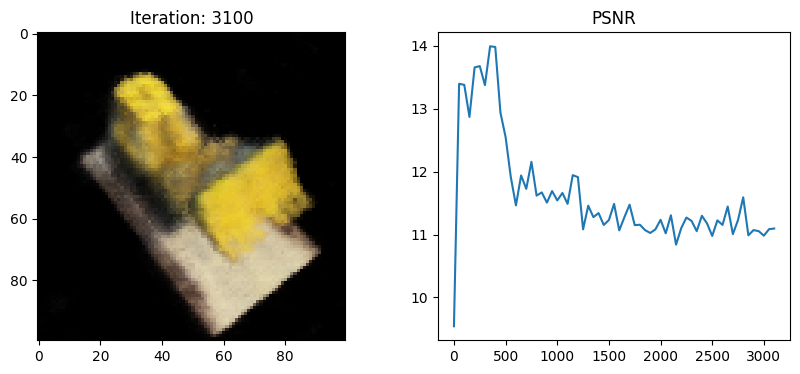

Iteration: 3150, Loss: 0.008073, Time: 0.05 sec/iter


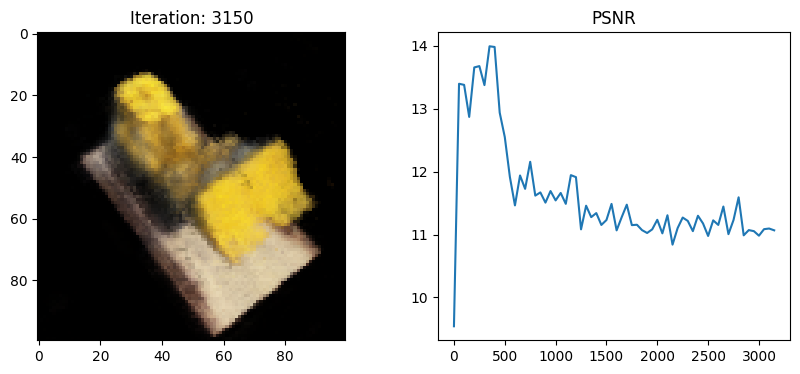

Iteration: 3200, Loss: 0.005855, Time: 0.05 sec/iter


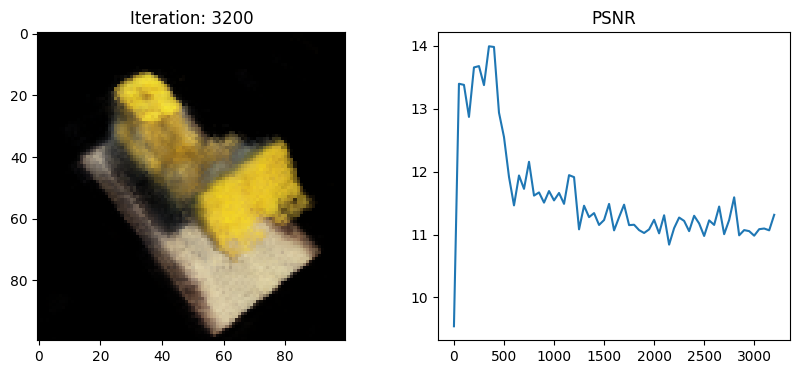

Iteration: 3250, Loss: 0.008234, Time: 0.06 sec/iter


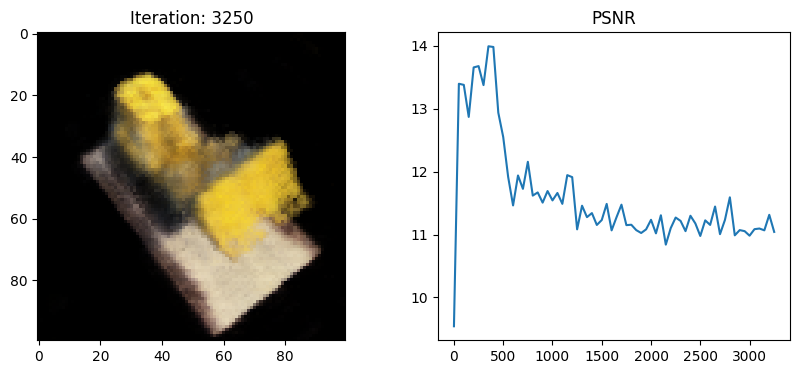

Iteration: 3300, Loss: 0.003607, Time: 0.05 sec/iter


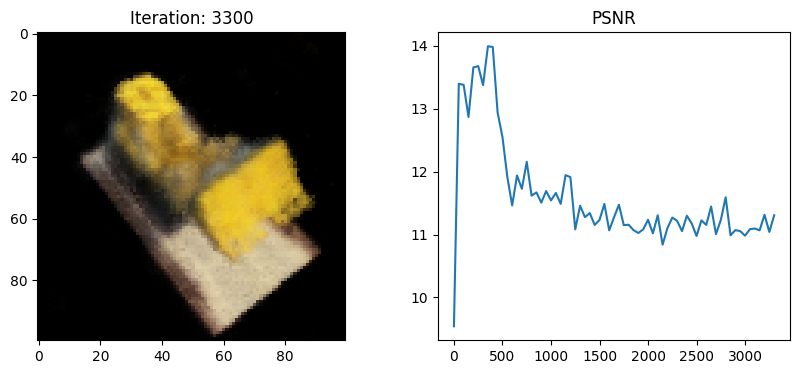

Iteration: 3350, Loss: 0.004102, Time: 0.05 sec/iter


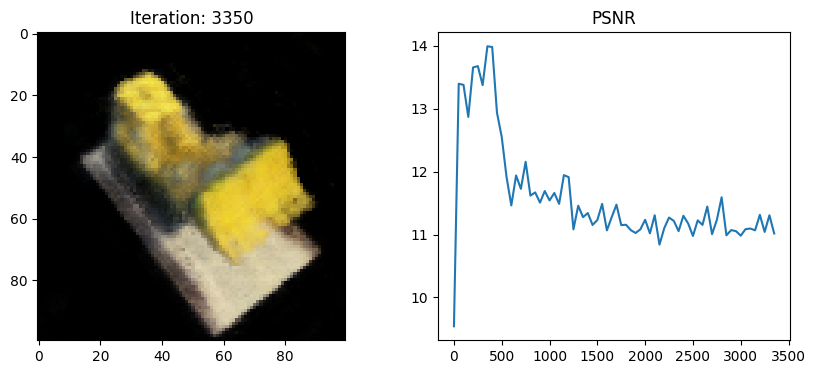

Iteration: 3400, Loss: 0.006293, Time: 0.05 sec/iter


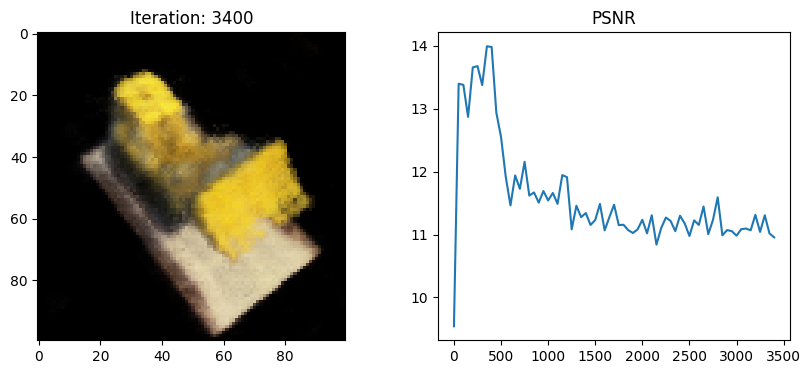

Iteration: 3450, Loss: 0.007972, Time: 0.05 sec/iter


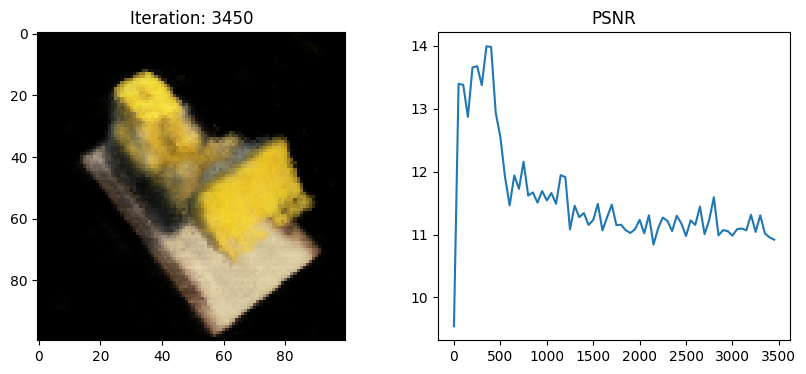

Iteration: 3500, Loss: 0.008159, Time: 0.05 sec/iter


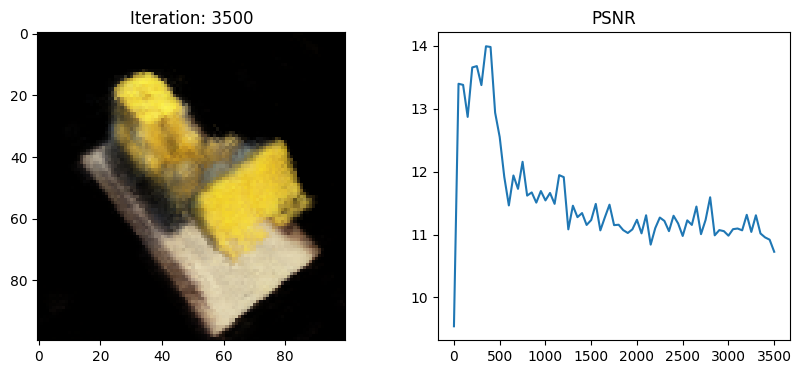

Iteration: 3550, Loss: 0.004246, Time: 0.05 sec/iter


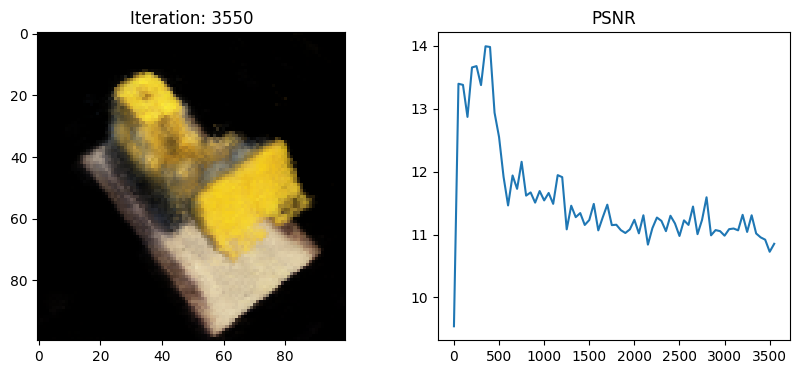

Iteration: 3600, Loss: 0.003749, Time: 0.05 sec/iter


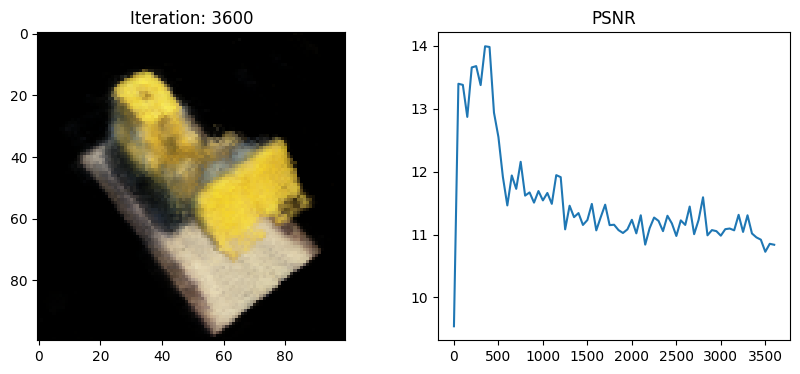

Iteration: 3650, Loss: 0.003279, Time: 0.05 sec/iter


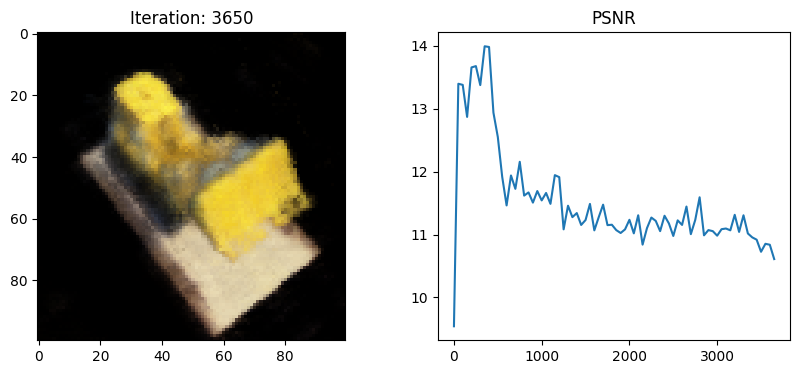

Iteration: 3700, Loss: 0.005397, Time: 0.05 sec/iter


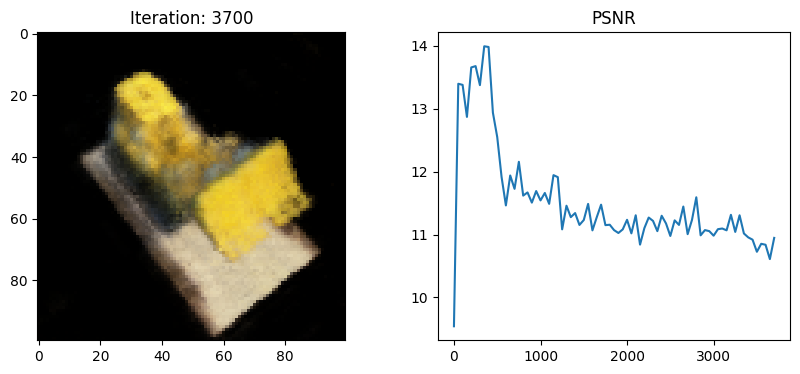

Iteration: 3750, Loss: 0.006888, Time: 0.05 sec/iter


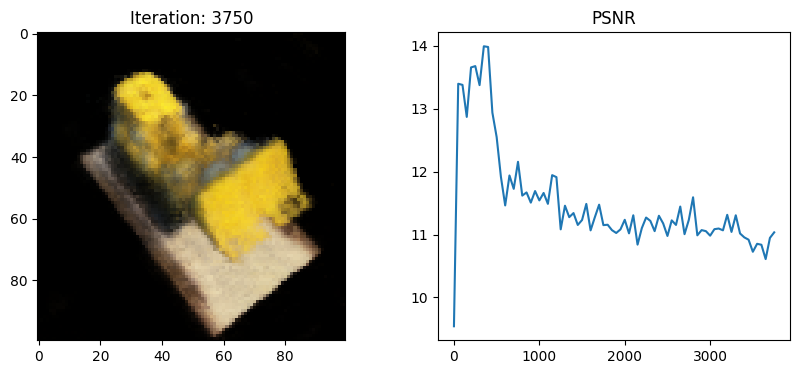

Iteration: 3800, Loss: 0.005068, Time: 0.05 sec/iter


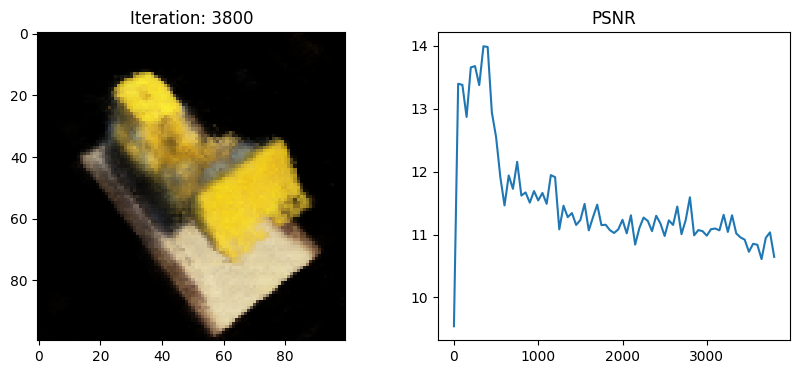

Iteration: 3850, Loss: 0.004698, Time: 0.06 sec/iter


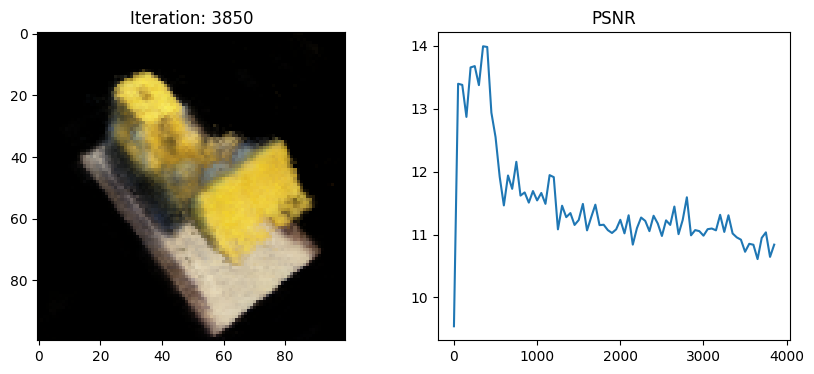

Iteration: 3900, Loss: 0.004015, Time: 0.05 sec/iter


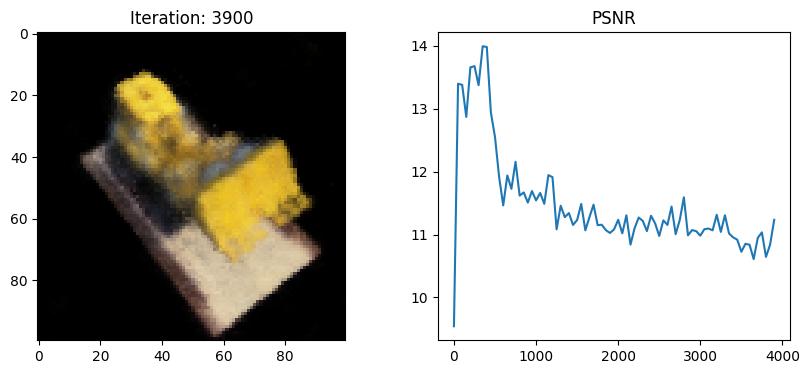

Iteration: 3950, Loss: 0.003946, Time: 0.05 sec/iter


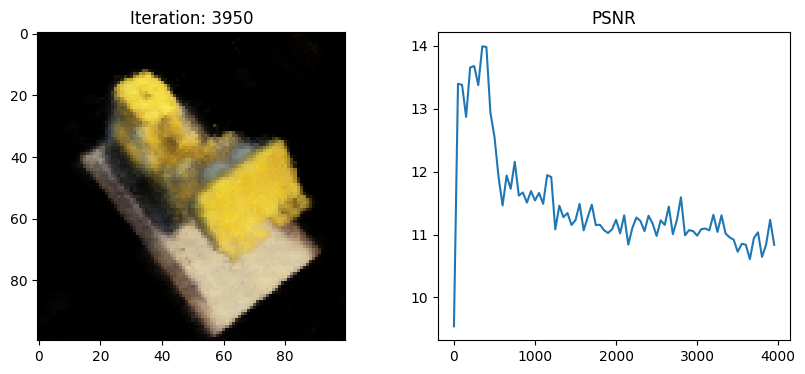

Iteration: 4000, Loss: 0.004863, Time: 0.05 sec/iter


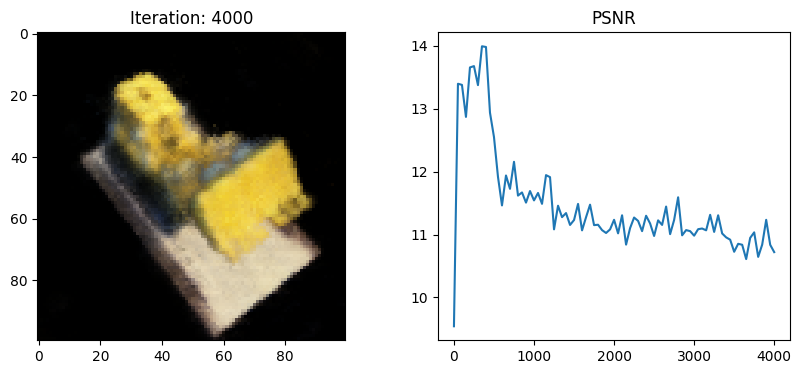

Iteration: 4050, Loss: 0.003078, Time: 0.05 sec/iter


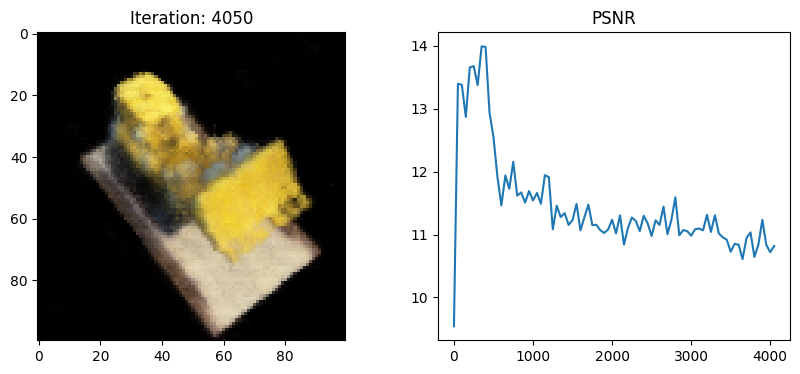

Iteration: 4100, Loss: 0.006475, Time: 0.05 sec/iter


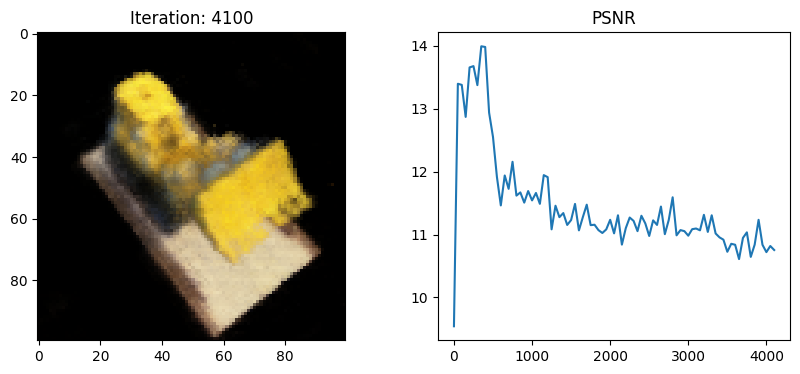

Iteration: 4150, Loss: 0.003919, Time: 0.05 sec/iter


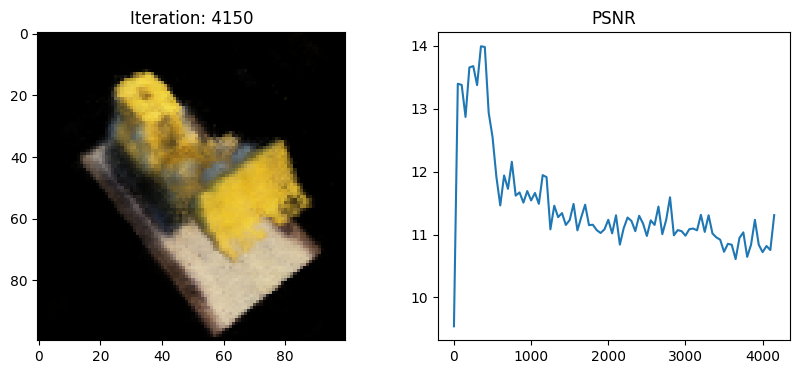

Iteration: 4200, Loss: 0.006879, Time: 0.06 sec/iter


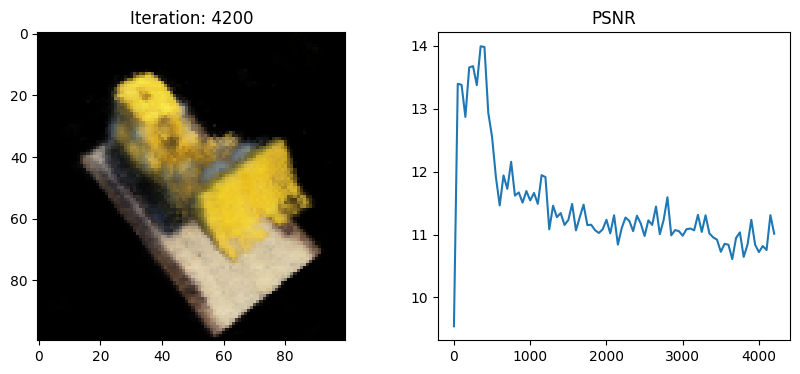

Iteration: 4250, Loss: 0.004540, Time: 0.05 sec/iter


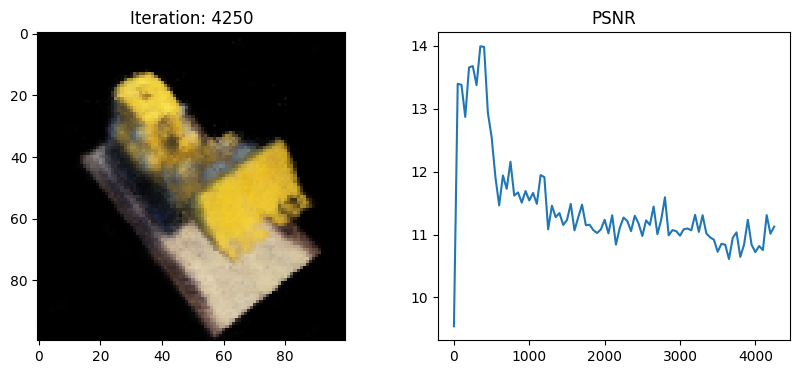

Iteration: 4300, Loss: 0.003297, Time: 0.05 sec/iter


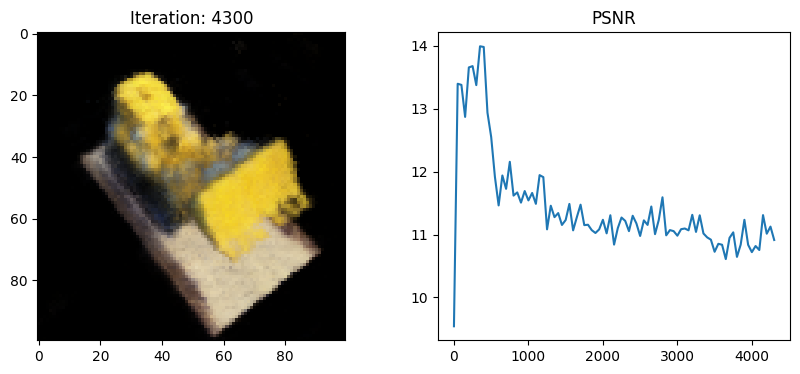

Iteration: 4350, Loss: 0.005167, Time: 0.05 sec/iter


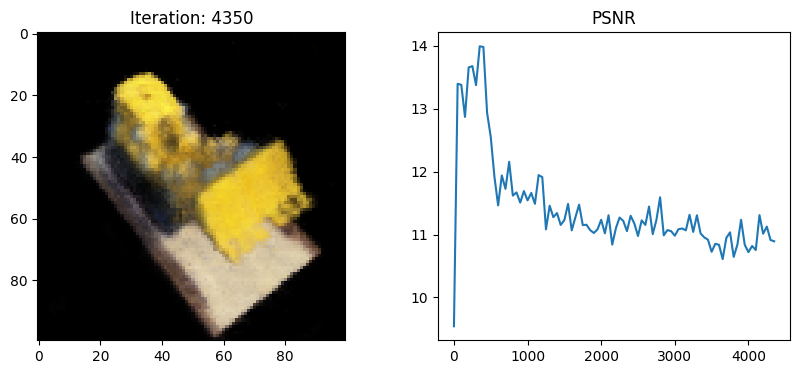

Iteration: 4400, Loss: 0.005486, Time: 0.05 sec/iter


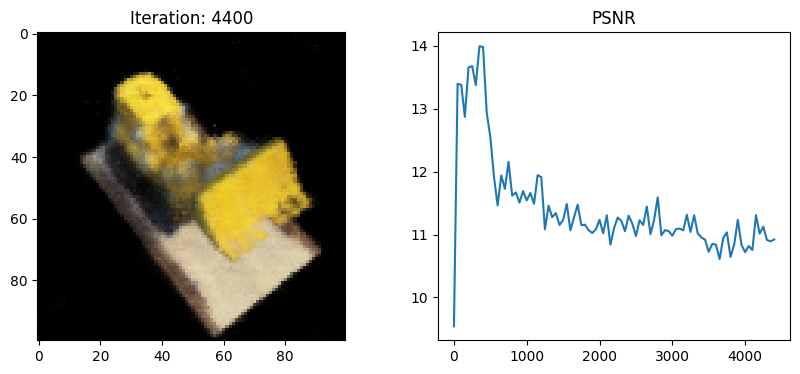

Iteration: 4450, Loss: 0.005418, Time: 0.05 sec/iter


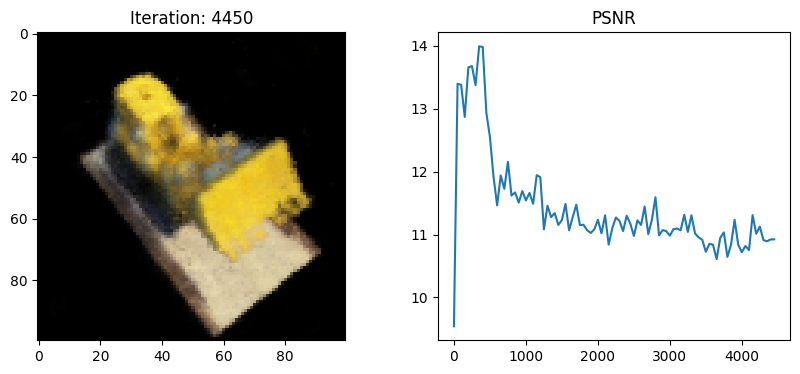

Iteration: 4500, Loss: 0.005234, Time: 0.05 sec/iter


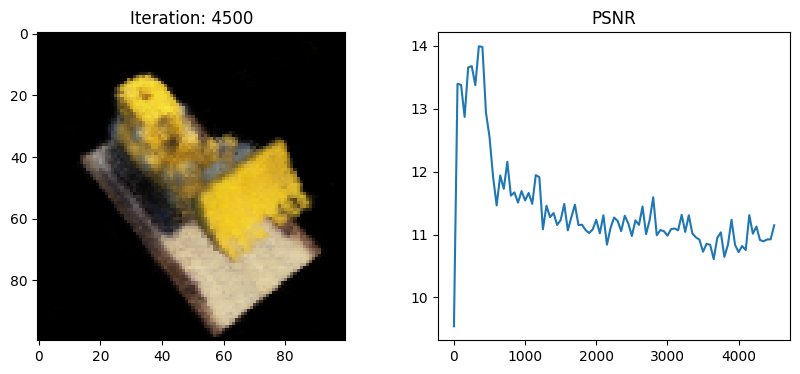

Iteration: 4550, Loss: 0.003412, Time: 0.05 sec/iter


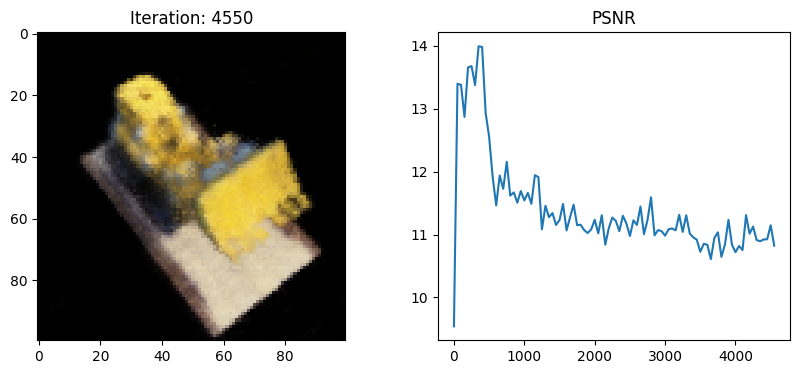

Iteration: 4600, Loss: 0.006363, Time: 0.05 sec/iter


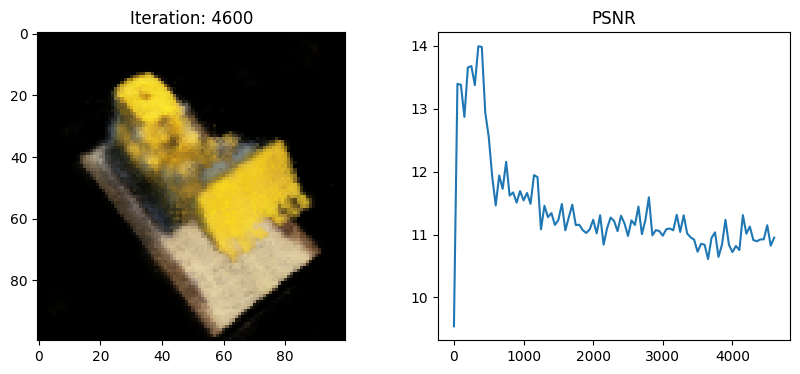

Iteration: 4650, Loss: 0.006823, Time: 0.05 sec/iter


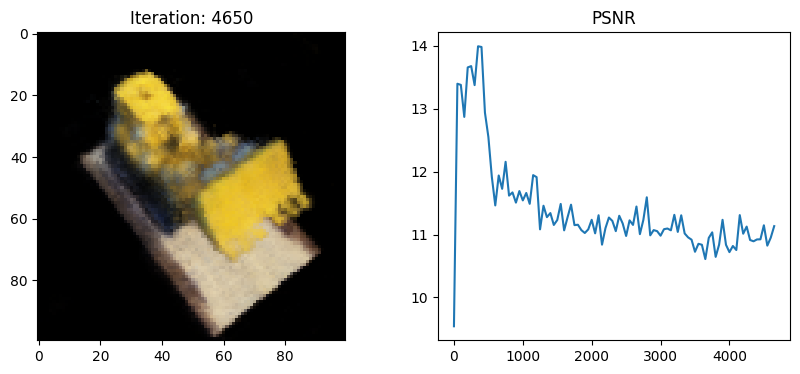

Iteration: 4700, Loss: 0.004158, Time: 0.05 sec/iter


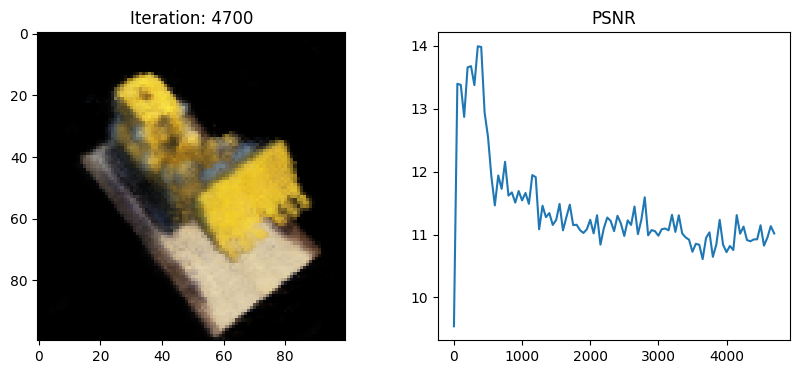

Iteration: 4750, Loss: 0.005115, Time: 0.05 sec/iter


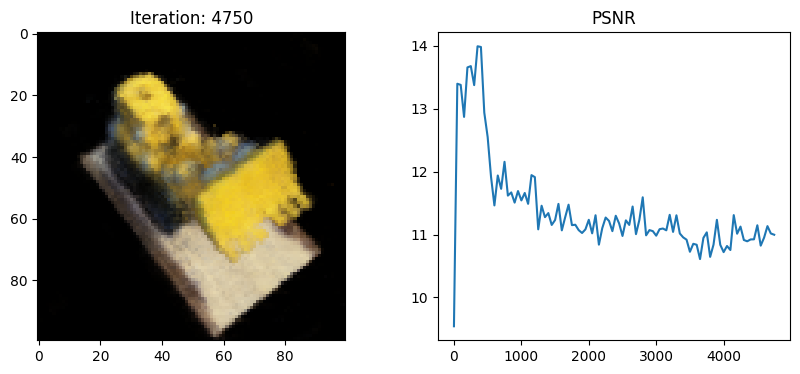

Iteration: 4800, Loss: 0.006816, Time: 0.05 sec/iter


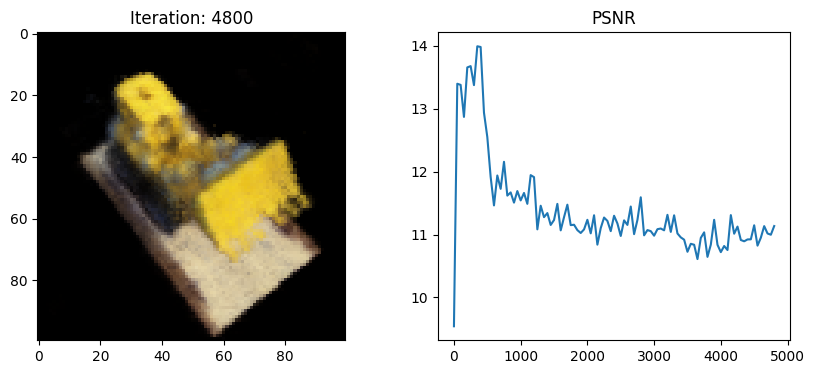

Iteration: 4850, Loss: 0.004270, Time: 0.06 sec/iter


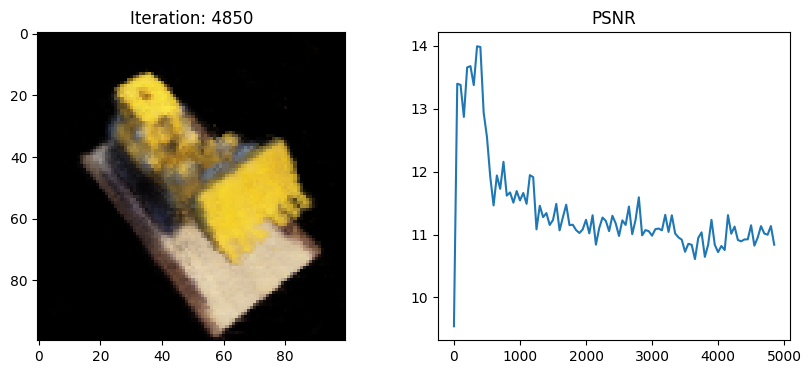

Iteration: 4900, Loss: 0.004584, Time: 0.05 sec/iter


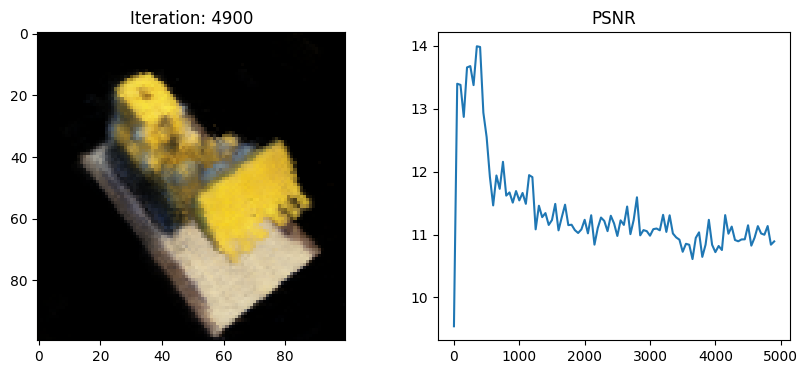

Iteration: 4950, Loss: 0.003022, Time: 0.05 sec/iter


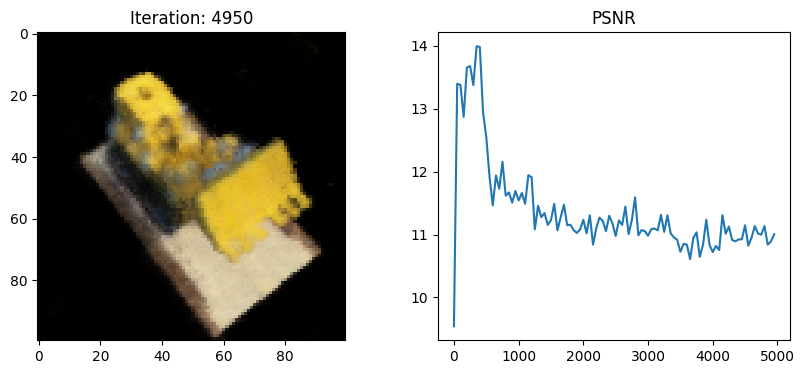

In [10]:
model = train(images,poses,H,W,focal,testpose,testimg,device)

# render video

In [11]:
# Transformation matrices in PyTorch
trans_t = lambda t: torch.tensor([
    [1, 0, 0, 0],
    [0, 1, 0, 0],
    [0, 0, 1, t],
    [0, 0, 0, 1]
], dtype=torch.float32)

rot_phi = lambda phi: torch.tensor([
    [1, 0, 0, 0],
    [0, torch.cos(phi), -torch.sin(phi), 0],
    [0, torch.sin(phi), torch.cos(phi), 0],
    [0, 0, 0, 1]
], dtype=torch.float32)

rot_theta = lambda th: torch.tensor([
    [torch.cos(th), 0, -torch.sin(th), 0],
    [0, 1, 0, 0],
    [torch.sin(th), 0, torch.cos(th), 0],
    [0, 0, 0, 1]
], dtype=torch.float32)

# Pose function with spherical coordinates
def pose_spherical(theta, phi, radius):
    c2w = trans_t(radius)
    c2w = torch.matmul(rot_phi(torch.Tensor([phi / 180. * np.pi])), c2w)
    c2w = torch.matmul(rot_theta(torch.Tensor([theta / 180. * np.pi])), c2w)
    c2w = torch.tensor([[-1, 0, 0, 0], [0, 0, 1, 0], [0, 1, 0, 0], [0, 0, 0, 1]], dtype=torch.float32) @ c2w
    return c2w

# Function for rendering based on user input
def f(**kwargs):
    c2w = pose_spherical(**kwargs)
    rays_o, rays_d = get_rays(H, W, focal, c2w[:3, :4])  # Get rays (this is a placeholder)
    c2w, rays_o, rays_d = map(lambda t: t.to(device), (c2w, rays_o, rays_d))
    with torch.no_grad():
      rgb, depth, acc = render_rays(model, rays_o, rays_d, near=2., far=6., N_samples=64, device=device)  # Render rays
    rgb = rgb.reshape(H, W, 3).cpu().detach()
    img = torch.clamp(rgb, 0, 1).numpy()  # Clamp RGB values between 0 and 1 and convert to numpy

    plt.figure(2, figsize=(20, 6))
    plt.imshow(img)
    plt.show()

# Interactive slider setup for theta, phi, and radius
sldr = lambda v, mi, ma: widgets.FloatSlider(
    value=v,
    min=mi,
    max=ma,
    step=.01,
)

names = [
    ['theta', [100., 0., 360]],
    ['phi', [-30., -90, 0]],
    ['radius', [4., 3., 5.]],
]

interactive_plot = interactive(f, **{s[0]: sldr(*s[1]) for s in names})
output = interactive_plot.children[-1]
output.layout.height = '350px'
interactive_plot

interactive(children=(FloatSlider(value=100.0, description='theta', max=360.0, step=0.01), FloatSlider(value=-…

In [12]:
frames = []
for th in tqdm(np.linspace(0., 360., 120, endpoint=False)):
    c2w = pose_spherical(th, -30., 4.)
    rays_o, rays_d = get_rays(H, W, focal, c2w[:3,:4])
    c2w, rays_o, rays_d = map(lambda t: t.to(device), (c2w, rays_o, rays_d))
    with torch.no_grad():
      rgb, depth, acc = render_rays(model, rays_o, rays_d, near=2., far=6., N_samples=64, device = device)
    rgb = rgb.reshape(H, W, 3)
    frames.append((255*np.clip(rgb.cpu().detach().numpy(),0,1)).astype(np.uint8))

import imageio
f = 'video.mp4'
imageio.mimwrite(f, frames, fps=30, quality=7)

100%|██████████| 120/120 [00:38<00:00,  3.13it/s]


In [13]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('video.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls autoplay loop>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)